In [17]:
import os
import random
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from tqdm import tqdm
from torchmetrics import MeanAbsolutePercentageError
from datetime import datetime, timedelta
rdseed = 123
def set_all_seeds(seed):
  random.seed(seed)
  os.environ['PYTHONHASHSEED'] = str(seed)
  np.random.seed(seed)
  torch.manual_seed(seed)
  torch.cuda.manual_seed(seed)
  torch.backends.cudnn.deterministic = True
set_all_seeds(rdseed)

In [18]:
# DLinear模型
class moving_avg(nn.Module):
    """
    Moving average block to highlight the trend of time series
    """
    def __init__(self, kernel_size, stride):
        super(moving_avg, self).__init__()
        self.kernel_size = kernel_size
        self.avg = nn.AvgPool1d(kernel_size=kernel_size, stride=stride, padding=0)

    def forward(self, x):
        # padding on the both ends of time series
        front = x[:, 0:1, :].repeat(1, (self.kernel_size - 1) // 2, 1)
        end = x[:, -1:, :].repeat(1, (self.kernel_size - 1) // 2, 1)
        x = torch.cat([front, x, end], dim=1)
        x = self.avg(x.permute(0, 2, 1))
        x = x.permute(0, 2, 1)
        return x


class series_decomp(nn.Module):
    """
    Series decomposition block
    """
    def __init__(self, kernel_size):
        super(series_decomp, self).__init__()
        self.moving_avg = moving_avg(kernel_size, stride=1)

    def forward(self, x):
        moving_mean = self.moving_avg(x)
        res = x - moving_mean
        return res, moving_mean

class DLinear(nn.Module):
    """
    Decomposition-Linear
    """
    def __init__(self, seq_len, pred_len, kernel_size):
        super(DLinear, self).__init__()
        self.seq_len = seq_len
        self.pred_len = pred_len

        # Decompsition Kernel Size
        self.decompsition = series_decomp(kernel_size)

        self.Linear_Seasonal = nn.Linear(self.seq_len,self.pred_len)
        self.Linear_Trend = nn.Linear(self.seq_len,self.pred_len)
        
        # Use this two lines if you want to visualize the weights
        # self.Linear_Seasonal.weight = nn.Parameter((1/self.seq_len)*torch.ones([self.pred_len,self.seq_len]))
        # self.Linear_Trend.weight = nn.Parameter((1/self.seq_len)*torch.ones([self.pred_len,self.seq_len]))

    def forward(self, x):
        # x: [Batch, Input length, Channel]
        seasonal_init, trend_init = self.decompsition(x)
        seasonal_init, trend_init = seasonal_init.permute(0,2,1), trend_init.permute(0,2,1)
 
        seasonal_output = self.Linear_Seasonal(seasonal_init)

        trend_output = self.Linear_Trend(trend_init)

        x = seasonal_output + trend_output
        return x.permute(0,2,1) # to [Batch, Output length, Channel]

In [19]:
class Dataset_Custom(Dataset):
    def __init__(self, df, seq_len, pred_len):
        self.df = df
        self.seq_len = seq_len
        self.pred_len = pred_len

    def __getitem__(self, index):
        # input
        input_begin = index
        input_end = input_begin + self.seq_len

        # label
        label_begin = input_end
        label_end = label_begin + self.pred_len

        seq_x = self.df[input_begin:input_end]
        seq_y = self.df[label_begin:label_end]

        return seq_x, seq_y

    def __len__(self):
        return len(self.df) - self.seq_len - self.pred_len + 1

def shift_date_24(start_date, days_to_shift):
    # 将字符串格式日期转换为 datetime 对象
    date_obj = datetime.strptime(start_date, '%Y-%m-%d')
    
    # 向后推移指定天数
    shifted_date = date_obj + timedelta(days=days_to_shift)
    
    # 将结果转换为字符串格式并返回
    shifted_date_str = shifted_date.strftime('%Y-%m-%d')
    return shifted_date_str
# 重新初始化模型的权重
def reset_weights(model):
    for layer in model.children():
        if hasattr(layer, 'reset_parameters'):
            layer.reset_parameters()


In [20]:
tickers = [
    "IVV", "IEFA", "AGG", "IWF", "IJH", "IEMG", "IJR", "IWM", "IWD", "ITOT",
    "EFA", "TLT", "IVW", "QUAL", "IXUS", "MUB", "IWB", "IWR", "IVE", "MBB",
    "IEF", "IAU", "LQD", "IUSB", "DGRO", "GOVT", "SHY", "USMV", "IGSB", "EEM",
    "SHV", "ACWI", "DVY", "TIP", "IUSG", "IYW", "EFV", "IUSV", "HYG", "EWJ",
    "EMB", "SOXX", "PFF", "IWP", "IWV", "IEI", "IGIB", "SLV", "IWS", "EFG",
    "OEF", "IWN", "IWO", "USIG", "MTUM", "INDA", "HDV", "IWY", "IJK", "SCZ",
    "SUB", "IQLT", "EZU", "STIP", "TLH", "IJJ", "FLOT", "IBB", "VLUE", "TFLO",
    "HEFA", "IJS", "EFAV", "ITA", "IGV", "SHYG", "IAGG", "IJT", "MCHI", "ICSH",
    "IOO", "EWY", "IHI", "IEUR", "EWT", "FXI", "EWZ", "ACWX", "IXN", "IGM",
    "EEMV", "DSI", "IDV", "ACWV", "ISTB", "IXJ", "IGF", "IXC", "REET", "SUSA",
    "URTH", "XT", "IYH", "GVI", "NEAR", "IYR", "EWU", "CMF", "EWC", "IYF",
    "IBDQ", "ITB", "IBDP", "AAXJ", "ICLN", "USRT", "IGLB", "ILCG", "IWX",
    "SLQD", "IMTM", "AOR", "EWW", "IMCG", "LRGF", "EPP", "ICVT", "ICF", "IYY",
    "IPAC", "AOA", "IVLU", "IEV", "EWA", "EUFN", "IYJ", "AIA", "ILF", "IYE",
    "IWL", "AOM", "IYG", "PICK", "IYK", "IDU", "IAI", "EWL", "INTF", "GSG",
    "SMLF", "QLTA", "EWP", "COMT", "EWG", "CRBN", "IYC", "ILCV", "SMIN", "ILCB",
    "IYT", "INDY", "KXI", "IWC", "IMCB", "IEO", "KSA", "IHF", "EUSA", "DVYE",
    "NYF", "IHE", "IYM", "EMGF", "EWQ", "REZ", "ECH", "IAK", "AGZ", "MEAR",
    "IMCV", "REM", "IAT", "AOK", "EXI", "IGE", "ILTB", "ISCG", "ISCF", "EWH",
    "IGOV", "RING", "EWI", "HEZU", "EWS", "EEMA", "LEMB", "CEMB", "FM", "ISCV",
    "EIDO", "CMBS", "EEMS", "IXG", "EMHY", "HEWJ", "EWD", "IXP", "LQDH", "EPOL",
    "GNMA", "SIZE", "EWM", "EDEN", "EWN", "EZA", "IEZ", "MXI", "HYGH", "RXI",
    "TUR", "THD", "SLVP", "HAWX", "GBF", "ISCB", "IYZ", "TOK", "WOOD", "BYLD",
    "EWZS", "HEEM", "IGBH", "EIS", "HSCZ", "JXI", "GHYG", "VEGI", "GLOF", "EPU",
    "SCJ", "EIRL", "IYLD", "FILL", "EPHE", "IFGL", "IEUS", "JPXN", "ENZL", "ISHG",
    "QAT", "BKF", "EWO", "FIBR", "ECNS", "HYXU", "DVYA", "EWUS", "IDGT", "UAE",
    "WPS", "HEWG", "ENOR", "EMIF", "EFNL", "EWK", "ISZE"
]


IVV


100%|██████████| 200/200 [00:01<00:00, 178.98it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IVV:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  376.690002  376.820007  366.160004  370.220001  352.802246   
318 2021-01-05  369.440002  373.829987  369.440002  372.670013  355.136993   
319 2021-01-06  371.019989  378.369995  370.459991  374.920013  357.281189   
320 2021-01-07  377.470001  381.260010  377.279999  380.470001  362.570038   
321 2021-01-08  382.010010  382.859985  378.489990  382.640015  364.637970   

      Volume    Return  
317  7103700  1.255366  
318  4310500  1.263674  
319  4343100  1.271303  
320  6051700  1.290122  
321  3400200  1.297481  
IEFA


100%|██████████| 200/200 [00:01<00:00, 183.35it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IEFA:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  70.440002  70.480003  69.209999  69.489998  63.399910   
318 2021-01-05  69.699997  70.419998  69.690002  70.269997  64.111557   
319 2021-01-06  70.370003  71.430000  70.339996  71.129997  64.896194   
320 2021-01-07  70.940002  71.220001  70.910004  71.129997  64.896194   
321 2021-01-08  71.639999  71.769997  71.010002  71.750000  65.461868   

       Volume    Return  
317  16828100  1.147078  
318   9754500  1.159954  
319  14787300  1.174150  
320   6964100  1.174150  
321   6950000  1.184384  
AGG


100%|██████████| 200/200 [00:01<00:00, 182.75it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


AGG:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  118.080002  118.139999  117.989998  118.040001  108.816223   
318 2021-01-05  118.059998  118.059998  117.750000  117.919998  108.705612   
319 2021-01-06  117.900002  117.900002  117.150002  117.339996  108.170914   
320 2021-01-07  117.129997  117.260002  117.070000  117.220001  108.060326   
321 2021-01-08  117.180000  117.339996  116.980003  117.080002  107.931259   

       Volume    Return  
317   6414100  1.043494  
318   7477900  1.042433  
319  10687200  1.037305  
320   6639400  1.036245  
321   7335700  1.035007  
IWF


100%|██████████| 200/200 [00:01<00:00, 181.62it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWF:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  242.000000  242.259995  234.369995  237.740005  232.380951   
318 2021-01-05  236.940002  239.250000  236.889999  238.979996  233.592972   
319 2021-01-06  235.860001  239.330002  234.779999  236.320007  230.992981   
320 2021-01-07  238.070007  242.289993  238.070007  241.690002  236.241928   
321 2021-01-08  243.160004  244.350006  241.199997  244.190002  238.685577   

      Volume    Return  
317  1927000  1.504112  
318  1324500  1.511957  
319  1435700  1.495129  
320  2429200  1.529103  
321  1255100  1.544920  
IJH


100%|██████████| 200/200 [00:00<00:00, 202.90it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IJH:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  46.262001  46.271999  44.869999  45.259998  43.150139   
318 2021-01-05  45.200001  46.118000  45.200001  45.916000  43.775558   
319 2021-01-06  46.264000  48.057999  46.216000  47.748001  45.522163   
320 2021-01-07  48.006001  48.348000  47.939999  48.251999  46.002666   
321 2021-01-08  48.456001  48.540001  47.646000  48.186001  45.939732   

       Volume    Return  
317  10959000  1.193628  
318   8949000  1.210929  
319  15151500  1.259244  
320   8679500  1.272535  
321   6665000  1.270795  
IEMG


100%|██████████| 200/200 [00:01<00:00, 183.94it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IEMG:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  63.200001  63.410000  62.270000  62.540001  57.501141   
318 2021-01-05  63.009998  63.939999  63.009998  63.889999  58.742374   
319 2021-01-06  63.419998  64.139999  63.240002  63.419998  58.310242   
320 2021-01-07  63.730000  63.950001  63.430000  63.919998  58.769958   
321 2021-01-08  65.040001  65.580002  64.660004  65.540001  60.259438   

       Volume    Return  
317  17414000  1.282346  
318  16305800  1.310027  
319  17275400  1.300390  
320   9154100  1.310642  
321  19814200  1.343859  
IJR


100%|██████████| 200/200 [00:01<00:00, 184.69it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IJR:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  92.500000  92.800003  89.790001  91.040001  86.836700   
318 2021-01-05  90.809998  93.620003  90.800003  92.980003  88.687126   
319 2021-01-06  94.000000  98.360001  94.000000  97.500000  92.998436   
320 2021-01-07  97.870003  98.720001  97.510002  98.529999  93.980873   
321 2021-01-08  99.339996  99.339996  96.559998  97.720001  93.208267   

      Volume    Return  
317  5909100  1.193028  
318  4135000  1.218451  
319  7860600  1.277683  
320  4208200  1.291181  
321  5387800  1.280566  
IWM


100%|██████████| 200/200 [00:01<00:00, 186.75it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWM:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  197.539993  197.889999  190.940002  193.500000  185.704117   
318 2021-01-05  193.089996  197.619995  193.070007  196.490005  188.573685   
319 2021-01-06  199.479996  206.779999  199.160004  204.529999  196.289749   
320 2021-01-07  205.710007  208.520004  205.699997  208.169998  199.783127   
321 2021-01-08  209.320007  209.770004  204.660004  207.720001  199.351227   

       Volume    Return  
317  33664200  1.304172  
318  27442900  1.324324  
319  52952200  1.378513  
320  24031400  1.403046  
321  29017000  1.400014  
IWD


100%|██████████| 200/200 [00:01<00:00, 188.91it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWD:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  137.210007  137.250000  133.779999  134.889999  126.475029   
318 2021-01-05  134.800003  136.710007  134.750000  136.050003  127.562653   
319 2021-01-06  136.820007  140.389999  136.809998  139.460007  130.759933   
320 2021-01-07  140.410004  141.270004  140.190002  140.679993  131.903763   
321 2021-01-08  141.100006  141.300003  139.449997  140.770004  131.988205   

      Volume    Return  
317  3598100  1.067337  
318  2024800  1.076515  
319  2965600  1.103497  
320  2613900  1.113151  
321  2715200  1.113863  
ITOT


100%|██████████| 200/200 [00:01<00:00, 189.37it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ITOT:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  86.589996  86.629997  84.110001  85.120003  81.171898   
318 2021-01-05  84.919998  86.000000  84.919998  85.760002  81.782211   
319 2021-01-06  85.489998  87.279999  85.370003  86.540001  82.526039   
320 2021-01-07  87.169998  88.050003  87.070000  87.860001  83.784805   
321 2021-01-08  88.250000  88.430000  87.330002  88.279999  84.185333   

      Volume    Return  
317  3729600  1.285412  
318  2234800  1.295077  
319  1776300  1.306856  
320  1109900  1.326789  
321  1341300  1.333132  
EFA


100%|██████████| 200/200 [00:01<00:00, 188.85it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EFA:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  74.389999  74.419998  73.050003  73.339996  67.067604   
318 2021-01-05  73.580002  74.279999  73.519997  74.099998  67.762611   
319 2021-01-06  74.300003  75.320000  74.220001  74.949997  68.539909   
320 2021-01-07  74.849998  75.139999  74.779999  75.029999  68.613068   
321 2021-01-08  75.580002  75.730003  74.949997  75.730003  69.253204   

       Volume    Return  
317  26703400  1.135822  
318  19748500  1.147592  
319  25426900  1.160756  
320  18783700  1.161995  
321  25272200  1.172836  
TLT


100%|██████████| 200/200 [00:01<00:00, 189.30it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


TLT:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  156.669998  158.179993  156.539993  157.539993  144.575211   
318 2021-01-05  156.949997  156.949997  155.660004  156.369995  143.501465   
319 2021-01-06  153.820007  153.850006  152.289993  153.160004  140.555664   
320 2021-01-07  151.789993  152.169998  151.259995  151.809998  139.316742   
321 2021-01-08  151.479996  151.960007  150.660004  151.320007  138.867050   

       Volume    Return  
317  13152900  1.099679  
318  10458100  1.091512  
319  22827300  1.069105  
320  14651900  1.059682  
321  13622500  1.056261  
IVW


100%|██████████| 200/200 [00:01<00:00, 187.43it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IVW:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  64.029999  64.110001  62.090000  62.869999  61.276623   
318 2021-01-05  62.660000  63.389999  62.660000  63.320000  61.715218   
319 2021-01-06  62.500000  63.490002  62.259998  62.689999  61.101189   
320 2021-01-07  63.160000  64.230003  63.160000  64.099998  62.475449   
321 2021-01-08  64.440002  64.790001  63.950001  64.750000  63.108971   

      Volume    Return  
317  8312100  1.412412  
318  3420200  1.422522  
319  3213400  1.408368  
320  1960800  1.440045  
321  2274800  1.454648  
QUAL


100%|██████████| 200/200 [00:01<00:00, 198.30it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


QUAL:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  116.419998  116.470001  113.150002  114.360001  109.381126   
318 2021-01-05  113.940002  115.150002  113.940002  114.820000  109.821106   
319 2021-01-06  114.279999  116.230003  114.000000  115.349998  110.328018   
320 2021-01-07  116.019997  116.889999  115.839996  116.650002  111.571419   
321 2021-01-08  117.099998  117.300003  116.059998  117.220001  112.116615   

     Volume    Return  
317  949900  1.253535  
318  719000  1.258577  
319  659200  1.264387  
320  667800  1.278636  
321  831500  1.284884  
IXUS


100%|██████████| 200/200 [00:01<00:00, 166.97it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IXUS:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  68.449997  68.510002  67.279999  67.580002  62.004463   
318 2021-01-05  67.900002  68.660004  67.900002  68.510002  62.857738   
319 2021-01-06  68.480003  69.370003  68.400002  68.930000  63.243080   
320 2021-01-07  68.989998  69.220001  68.849998  69.190002  63.481640   
321 2021-01-08  69.879997  70.080002  69.349998  70.080002  64.298218   

      Volume    Return  
317  3847900  1.180024  
318  1535700  1.196263  
319  2991000  1.203597  
320  1292700  1.208137  
321  2338400  1.223677  
MUB


100%|██████████| 200/200 [00:01<00:00, 178.54it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


MUB:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  117.099998  117.160004  117.050003  117.129997  108.862663   
318 2021-01-05  117.160004  117.239998  117.110001  117.230003  108.955597   
319 2021-01-06  117.220001  117.220001  116.919998  117.110001  108.844055   
320 2021-01-07  117.089996  117.190002  117.010002  117.110001  108.844055   
321 2021-01-08  117.120003  117.129997  116.839996  116.910004  108.658173   

      Volume    Return  
317  1412700  1.028087  
318  1183400  1.028965  
319  1736100  1.027912  
320  1382600  1.027912  
321  1522900  1.026156  
IWB


100%|██████████| 200/200 [00:01<00:00, 176.81it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWB:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  212.759995  212.990005  206.710007  208.889999  199.845703   
318 2021-01-05  208.559998  211.029999  208.559998  210.529999  201.414703   
319 2021-01-06  209.389999  213.770004  209.380005  211.889999  202.715805   
320 2021-01-07  213.339996  215.610001  213.309998  215.130005  205.815506   
321 2021-01-08  216.169998  216.490005  214.039993  216.419998  207.049652   

      Volume    Return  
317   888800  1.284923  
318   379400  1.295011  
319  1145000  1.303377  
320   580800  1.323307  
321   424600  1.331242  
IWR


100%|██████████| 200/200 [00:01<00:00, 187.92it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWR:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  68.820000  68.940002  66.830002  67.449997  64.502449   
318 2021-01-05  67.410004  68.320000  67.250000  68.160004  65.181427   
319 2021-01-06  68.269997  70.040001  68.269997  69.540001  66.501114   
320 2021-01-07  70.080002  70.680000  70.000000  70.589996  67.505226   
321 2021-01-08  70.919998  71.129997  70.000000  70.730003  67.639107   

      Volume    Return  
317  2008900  1.223028  
318  1394400  1.235902  
319  1321800  1.260925  
320  1214600  1.279964  
321  1346100  1.282502  
IVE


100%|██████████| 200/200 [00:01<00:00, 190.86it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IVE:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  128.399994  128.440002  125.250000  126.320000  118.597664   
318 2021-01-05  126.230003  127.860001  126.010002  127.209999  119.433235   
319 2021-01-06  127.830002  130.990005  127.769997  130.119995  122.165329   
320 2021-01-07  131.059998  131.699997  130.639999  131.139999  123.123001   
321 2021-01-08  131.369995  131.529999  129.990005  131.220001  123.198090   

      Volume    Return  
317  2108100  1.073146  
318   677600  1.080707  
319   986200  1.105429  
320   732400  1.114094  
321   558200  1.114774  
MBB


100%|██████████| 200/200 [00:01<00:00, 185.76it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


MBB:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  110.129997  110.180000  110.110001  110.139999  101.701248   
318 2021-01-05  110.250000  110.250000  110.150002  110.199997  101.756660   
319 2021-01-06  110.150002  110.199997  110.089996  110.150002  101.710487   
320 2021-01-07  110.180000  110.180000  110.099998  110.120003  101.682808   
321 2021-01-08  110.139999  110.150002  110.089996  110.089996  101.655098   

      Volume    Return  
317  1220000  1.018966  
318  1164100  1.019521  
319  2082100  1.019058  
320  1624300  1.018781  
321  1580700  1.018503  
IEF


100%|██████████| 200/200 [00:01<00:00, 185.32it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(14, 4))


IEF:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  119.680000  120.059998  119.650002  119.980003  112.175362   
318 2021-01-05  119.870003  119.889999  119.580002  119.699997  111.913574   
319 2021-01-06  119.120003  119.120003  118.769997  119.000000  111.259102   
320 2021-01-07  118.580002  118.660004  118.480003  118.580002  110.866432   
321 2021-01-08  118.349998  118.430000  118.129997  118.239998  110.548531   

       Volume    Return  
317   5499000  1.065447  
318   5004400  1.062961  
319  10039300  1.056745  
320   7751700  1.053015  
321   8378700  1.049996  
IAU


100%|██████████| 200/200 [00:00<00:00, 215.80it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IAU:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  36.959999  37.099998  36.779999  37.099998  37.099998   
318 2021-01-05  37.180000  37.259998  36.980000  37.180000  37.180000   
319 2021-01-06  36.919998  36.919998  36.240002  36.599998  36.599998   
320 2021-01-07  36.540001  36.580002  36.360001  36.480000  36.480000   
321 2021-01-08  35.959999  36.000000  34.860001  35.259998  35.259998   

       Volume    Return  
317  16074700  1.309104  
318  11376700  1.311927  
319  18060850  1.291461  
320  10712400  1.287227  
321  15582650  1.244178  
LQD


100%|██████████| 200/200 [00:00<00:00, 201.61it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


LQD:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  137.889999  137.889999  137.380005  137.429993  123.057152   
318 2021-01-05  137.059998  137.059998  136.550003  136.990005  122.663116   
319 2021-01-06  135.779999  135.979996  135.399994  135.880005  121.669250   
320 2021-01-07  135.559998  135.949997  135.539993  135.860001  121.651306   
321 2021-01-08  135.779999  135.889999  135.449997  135.759995  121.561775   

       Volume    Return  
317  14891400  1.079661  
318  16294400  1.076204  
319  19136500  1.067484  
320  11886100  1.067327  
321  13341400  1.066541  
IUSB


100%|██████████| 200/200 [00:01<00:00, 170.15it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IUSB:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  54.540001  54.560001  54.470001  54.490002  49.823151   
318 2021-01-05  54.509998  54.529999  54.410000  54.459999  49.795731   
319 2021-01-06  54.270000  54.270000  54.119999  54.259998  49.612843   
320 2021-01-07  54.110001  54.209999  54.099998  54.169998  49.530563   
321 2021-01-08  54.150002  54.169998  54.080002  54.139999  49.503124   

      Volume    Return  
317   678700  1.041476  
318  1335900  1.040902  
319   493300  1.037079  
320   485500  1.035359  
321   572100  1.034786  
DGRO


100%|██████████| 200/200 [00:01<00:00, 192.70it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


DGRO:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  44.950001  44.950001  43.783001  44.189999  40.963467   
318 2021-01-05  44.139999  44.529999  43.978001  44.430000  41.185947   
319 2021-01-06  44.450001  45.547001  44.450001  45.250000  41.946079   
320 2021-01-07  45.529999  45.790001  45.380001  45.590000  42.261253   
321 2021-01-08  45.720001  45.724998  45.195999  45.639999  42.307602   

      Volume    Return  
317  2444200  1.145412  
318  1570400  1.151633  
319  2431900  1.172887  
320  1550400  1.181700  
321  1801700  1.182996  
GOVT


100%|██████████| 200/200 [00:01<00:00, 196.12it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


GOVT:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  27.330000  27.400000  27.320000  27.379999  25.698107   
318 2021-01-05  27.360001  27.360001  27.290001  27.320000  25.641794   
319 2021-01-06  27.190001  27.200001  27.120001  27.160000  25.491619   
320 2021-01-07  27.080000  27.110001  27.070000  27.090000  25.425920   
321 2021-01-08  27.059999  27.090000  27.020000  27.049999  25.388376   

      Volume    Return  
317  4163900  1.039089  
318  3686800  1.036812  
319  6560600  1.030740  
320  9360500  1.028083  
321  7121500  1.026565  
SHY


100%|██████████| 200/200 [00:01<00:00, 190.34it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SHY:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  86.370003  86.400002  86.370003  86.389999  81.520836   
318 2021-01-05  86.389999  86.400002  86.370003  86.389999  81.520836   
319 2021-01-06  86.360001  86.370003  86.320000  86.339996  81.473633   
320 2021-01-07  86.349998  86.360001  86.330002  86.360001  81.492500   
321 2021-01-08  86.330002  86.349998  86.330002  86.349998  81.483078   

      Volume    Return  
317  2989300  1.018990  
318  2529400  1.018990  
319  2082000  1.018401  
320  4207700  1.018636  
321  2760300  1.018519  
USMV


100%|██████████| 200/200 [00:01<00:00, 181.38it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


USMV:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  67.919998  68.059998  66.330002  66.930000  63.436775   
318 2021-01-05  66.750000  67.120003  66.459999  67.000000  63.503132   
319 2021-01-06  66.540001  67.889999  66.540001  67.610001  64.081299   
320 2021-01-07  67.660004  68.190002  67.580002  68.019997  64.469872   
321 2021-01-08  67.910004  68.430000  67.790001  68.379997  64.811104   

      Volume    Return  
317  6084100  1.053021  
318  4288100  1.054122  
319  4898400  1.063719  
320  4070500  1.070170  
321  4565000  1.075834  
IGSB


100%|██████████| 200/200 [00:01<00:00, 186.02it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IGSB:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  55.169998  55.180000  55.130001  55.169998  50.834885   
318 2021-01-05  55.060001  55.150002  55.060001  55.139999  50.807240   
319 2021-01-06  55.099998  55.110001  55.060001  55.090000  50.761169   
320 2021-01-07  55.049999  55.099998  55.049999  55.090000  50.761169   
321 2021-01-08  55.090000  55.090000  55.040001  55.080002  50.751972   

      Volume    Return  
317  1833300  1.028715  
318  2475100  1.028156  
319  2005400  1.027224  
320  2110400  1.027224  
321  1984900  1.027037  
EEM


100%|██████████| 200/200 [00:01<00:00, 183.25it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EEM:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  52.619999  52.810001  51.830002  52.000000  48.520840   
318 2021-01-05  52.490002  53.270000  52.490002  53.250000  49.687202   
319 2021-01-06  52.849998  53.439999  52.660000  52.799999  49.267311   
320 2021-01-07  53.080002  53.299999  52.820000  53.299999  49.733852   
321 2021-01-08  54.250000  54.740002  53.939999  54.709999  51.049515   

       Volume    Return  
317  48201300  1.281419  
318  53358000  1.312223  
319  56418700  1.301133  
320  41031300  1.313455  
321  76024300  1.348201  
SHV


100%|██████████| 200/200 [00:01<00:00, 188.96it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SHV:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  110.529999  110.529999  110.519997  110.519997  102.219032   
318 2021-01-05  110.519997  110.529999  110.519997  110.519997  102.219032   
319 2021-01-06  110.519997  110.529999  110.510002  110.529999  102.228310   
320 2021-01-07  110.519997  110.529999  110.519997  110.529999  102.228310   
321 2021-01-08  110.519997  110.529999  110.510002  110.519997  102.219032   

      Volume    Return  
317  6406600  1.000724  
318  3451400  1.000724  
319  1952500  1.000815  
320  1798300  1.000815  
321  2267100  1.000724  
ACWI


100%|██████████| 200/200 [00:01<00:00, 184.85it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ACWI:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  91.599998  91.629997  89.440002  90.220001  85.468536   
318 2021-01-05  90.320000  91.309998  90.269997  91.150002  86.349556   
319 2021-01-06  90.830002  92.419998  90.720001  91.660004  86.832703   
320 2021-01-07  92.089996  92.779999  92.010002  92.620003  87.742165   
321 2021-01-08  93.300003  93.489998  92.500000  93.440002  88.518967   

      Volume    Return  
317  5006200  1.237586  
318  1805800  1.250343  
319  9674400  1.257339  
320  4807800  1.270508  
321  3654600  1.281756  
DVY


100%|██████████| 200/200 [00:01<00:00, 183.74it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


DVY:          date        Open        High        Low      Close  Adj Close  \
317 2021-01-04   96.839996   96.839996  94.120003  94.760002  84.491241   
318 2021-01-05   94.879997   96.480003  94.690002  95.849998  85.463127   
319 2021-01-06   96.970001  100.250000  96.970001  99.639999  88.842415   
320 2021-01-07  100.330002  100.790001  99.820000  99.949997  89.118820   
321 2021-01-08  100.029999  100.269997  98.449997  99.440002  88.664093   

      Volume    Return  
317  1151600  0.941293  
318  1260400  0.952121  
319  1215900  0.989769  
320   750400  0.992848  
321   715500  0.987782  
TIP


100%|██████████| 200/200 [00:01<00:00, 174.30it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


TIP:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  127.489998  127.919998  127.459999  127.790001  111.003334   
318 2021-01-05  127.690002  127.800003  127.580002  127.750000  110.968620   
319 2021-01-06  127.519997  127.519997  127.129997  127.370003  110.638504   
320 2021-01-07  127.180000  127.370003  127.180000  127.290001  110.568993   
321 2021-01-08  127.150002  127.180000  126.580002  126.790001  110.134682   

      Volume    Return  
317  3859900  1.098607  
318  3888000  1.098263  
319  3917200  1.094997  
320  3264000  1.094309  
321  2292500  1.090010  
IUSG


100%|██████████| 200/200 [00:01<00:00, 181.91it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IUSG:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  89.089996  89.089996  86.300003  87.449997  84.849915  864400   
318 2021-01-05  87.120003  88.080002  87.000000  88.019997  85.402969  369300   
319 2021-01-06  87.110001  88.400002  86.660004  87.419998  84.820801  396400   
320 2021-01-07  88.000000  89.440002  88.000000  89.290001  86.635223  482500   
321 2021-01-08  89.720001  90.180000  89.040001  90.160004  87.479340  492400   

       Return  
317  1.405497  
318  1.414658  
319  1.405014  
320  1.435069  
321  1.449052  
IYW


100%|██████████| 200/200 [00:01<00:00, 183.79it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYW:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  85.529999  85.529999  82.690002  83.820000  82.713470  757800   
318 2021-01-05  83.500000  84.599998  83.500000  84.500000  83.384491  510600   
319 2021-01-06  83.019997  84.389999  82.669998  82.910004  81.815475  504300   
320 2021-01-07  83.739998  85.599998  83.739998  85.370003  84.242996  797500   
321 2021-01-08  85.940002  86.230003  85.029999  85.980003  84.844955  401400   

       Return  
317  1.659063  
318  1.672522  
319  1.641051  
320  1.689742  
321  1.701816  
EFV


100%|██████████| 200/200 [00:01<00:00, 182.76it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EFV:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  48.049999  48.119999  47.209999  47.410000  41.821724   
318 2021-01-05  47.520000  48.060001  47.520000  47.880001  42.236320   
319 2021-01-06  48.560001  49.320000  48.560001  49.080002  43.294876   
320 2021-01-07  49.119999  49.360001  49.119999  49.320000  43.506584   
321 2021-01-08  49.480000  49.500000  49.009998  49.470001  43.638908   

      Volume    Return  
317  1214300  1.010228  
318   547700  1.020243  
319   861500  1.045813  
320  1696000  1.050927  
321  2957500  1.054123  
IUSV


100%|██████████| 200/200 [00:00<00:00, 206.58it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IUSV:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  62.400002  62.400002  60.840000  61.279999  57.343182  756100   
318 2021-01-05  61.279999  62.090000  61.220001  61.770000  57.801697  469900   
319 2021-01-06  62.000000  63.720001  62.000000  63.270000  59.205338  540400   
320 2021-01-07  63.720001  64.040001  63.560001  63.750000  59.654499  660400   
321 2021-01-08  63.810001  63.950001  63.169998  63.799999  59.701294  570300   

       Return  
317  1.076221  
318  1.084826  
319  1.111170  
320  1.119600  
321  1.120478  
HYG


100%|██████████| 200/200 [00:01<00:00, 192.12it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


HYG:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  87.400002  87.400002  86.870003  87.120003  73.408127   
318 2021-01-05  87.019997  87.250000  86.980003  87.150002  73.433411   
319 2021-01-06  87.089996  87.339996  86.970001  86.989998  73.298569   
320 2021-01-07  87.180000  87.370003  87.129997  87.239998  73.509239   
321 2021-01-08  87.349998  87.379997  87.139999  87.370003  73.618790   

       Volume    Return  
317  34528300  1.005772  
318  33725500  1.006119  
319  37148100  1.004271  
320  25868200  1.007158  
321  27403600  1.008659  
EWJ


100%|██████████| 200/200 [00:01<00:00, 179.27it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWJ:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  67.620003  67.629997  66.639999  66.760002  63.306477   
318 2021-01-05  67.000000  67.570000  67.000000  67.379997  63.894409   
319 2021-01-06  67.309998  68.389999  67.279999  68.180000  64.653023   
320 2021-01-07  67.870003  68.180000  67.809998  68.040001  64.520264   
321 2021-01-08  69.139999  69.330002  68.550003  69.290001  65.705605   

      Volume    Return  
317  9211700  1.181802  
318  5756200  1.192777  
319  7863500  1.206939  
320  8367000  1.204461  
321  9557400  1.226589  
EMB


100%|██████████| 200/200 [00:01<00:00, 184.41it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EMB:          date        Open        High         Low       Close  Adj Close  \
317 2021-01-04  116.019997  116.089996  115.220001  115.269997  98.960075   
318 2021-01-05  115.400002  115.400002  115.129997  115.349998  99.028770   
319 2021-01-06  114.660004  114.680000  114.379997  114.519997  98.316200   
320 2021-01-07  114.550003  114.550003  114.239998  114.480003  98.281876   
321 2021-01-08  114.559998  114.589996  114.279999  114.540001  98.333366   

      Volume    Return  
317  7154100  1.025443  
318  3575900  1.026154  
319  4796000  1.018771  
320  2780500  1.018415  
321  4835200  1.018948  
SOXX


100%|██████████| 200/200 [00:01<00:00, 183.71it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SOXX:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  127.213333  129.926666  124.953331  125.863335  115.432076   
318 2021-01-05  125.763336  128.436661  125.666664  128.436661  117.792114   
319 2021-01-06  127.033333  130.536667  126.856667  128.020004  117.409988   
320 2021-01-07  129.893326  133.176666  129.893326  132.850006  121.839722   
321 2021-01-08  134.753326  135.369995  131.360001  132.919998  121.903893   

      Volume    Return  
317  2487600  1.802941  
318  1670700  1.839803  
319  3215100  1.833835  
320  1809000  1.903023  
321  2119800  1.904025  
PFF


100%|██████████| 200/200 [00:01<00:00, 175.13it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


PFF:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  38.560001  38.560001  38.040001  38.139999  31.836269   
318 2021-01-05  38.049999  38.320000  38.040001  38.320000  31.986519   
319 2021-01-06  38.169998  38.240002  37.759998  38.070000  31.777847   
320 2021-01-07  38.040001  38.099998  37.770000  37.970001  31.694365   
321 2021-01-08  37.959999  38.090000  37.919998  37.970001  31.694365   

      Volume    Return  
317  7083500  1.021972  
318  5890500  1.026795  
319  9988600  1.020096  
320  8691600  1.017417  
321  7343800  1.017417  
IWP


100%|██████████| 200/200 [00:01<00:00, 186.24it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWP:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  103.110001  103.169998   99.910004  101.180000   99.415993   
318 2021-01-05  100.959999  102.099998  100.879997  101.980003  100.202034   
319 2021-01-06  101.099998  103.029999  100.900002  102.029999  100.251152   
320 2021-01-07  102.800003  105.059998  102.800003  104.900002  103.071129   
321 2021-01-08  105.160004  106.480003  104.669998  105.860001  104.014389   

      Volume    Return  
317  1681900  1.448533  
318  1076100  1.459986  
319   963100  1.460702  
320   686300  1.501790  
321   566300  1.515533  
IWV


100%|██████████| 200/200 [00:00<00:00, 206.67it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWV:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  224.470001  224.500000  218.360001  220.589996  211.324966   
318 2021-01-05  220.130005  222.960007  220.130005  222.460007  213.116409   
319 2021-01-06  221.460007  226.410004  221.460007  224.169998  214.754608   
320 2021-01-07  225.649994  228.339996  225.649994  227.839996  218.270432   
321 2021-01-08  228.910004  229.199997  226.520004  229.050003  219.429626   

     Volume    Return  
317  458000  1.286014  
318  844200  1.296916  
319  306100  1.306885  
320  345300  1.328281  
321  235200  1.335335  
IEI


100%|██████████| 200/200 [00:01<00:00, 185.70it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IEI:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  132.880005  133.050003  132.860001  133.020004  125.951271   
318 2021-01-05  133.020004  133.020004  132.850006  132.910004  125.847115   
319 2021-01-06  132.679993  132.679993  132.479996  132.589996  125.544098   
320 2021-01-07  132.410004  132.460007  132.389999  132.429993  125.392601   
321 2021-01-08  132.309998  132.350006  132.210007  132.270004  125.241119   

      Volume    Return  
317   848800  1.048227  
318   992800  1.047360  
319   870900  1.044838  
320  1404100  1.043578  
321  1000600  1.042317  
IGIB


100%|██████████| 200/200 [00:00<00:00, 209.62it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IGIB:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  61.759998  61.770000  61.669998  61.740002  55.460667   
318 2021-01-05  61.639999  61.660000  61.540001  61.599998  55.334908   
319 2021-01-06  61.349998  61.419998  61.290001  61.410000  55.164249   
320 2021-01-07  61.299999  61.360001  61.270000  61.349998  55.110325   
321 2021-01-08  61.290001  61.310001  61.169998  61.250000  55.020515   

      Volume    Return  
317  1283100  1.067612  
318  1148200  1.065191  
319  1628500  1.061906  
320   884800  1.060868  
321  1045800  1.059139  
SLV


100%|██████████| 200/200 [00:01<00:00, 183.72it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SLV:          date       Open       High        Low  Close  Adj Close     Volume  \
317 2021-01-04  25.540001  25.610001  24.870001  25.35      25.35   54026000   
318 2021-01-05  25.459999  25.740000  25.280001  25.67      25.67   32882000   
319 2021-01-06  25.340000  25.400000  24.719999  25.34      25.34   54978700   
320 2021-01-07  25.219999  25.370001  25.049999  25.26      25.26   27335800   
321 2021-01-08  24.730000  24.760000  22.740000  23.51      23.51  107226800   

       Return  
317  1.569660  
318  1.589474  
319  1.569040  
320  1.564087  
321  1.455728  
IWS


100%|██████████| 200/200 [00:01<00:00, 189.19it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWS:          date        Open        High        Low       Close  Adj Close  \
317 2021-01-04   97.419998   97.440002  94.650002   95.269997  90.101082   
318 2021-01-05   95.300003   96.839996  95.300003   96.360001  91.131943   
319 2021-01-06   96.830002  100.040001  96.830002   99.449997  94.054283   
320 2021-01-07  100.089996  100.519997  99.769997  100.209999  94.773056   
321 2021-01-08  100.629997  100.650002  99.029999  100.129997  94.697403   

     Volume    Return  
317  731300  1.080036  
318  424800  1.092393  
319  783300  1.127423  
320  644100  1.136039  
321  402000  1.135132  
EFG


100%|██████████| 200/200 [00:01<00:00, 183.10it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EFG:          date        Open        High         Low       Close  Adj Close  \
317 2021-01-04  102.959999  102.959999  101.150002  101.690002  97.281448   
318 2021-01-05  101.830002  102.680000  101.690002  102.309998  97.874565   
319 2021-01-06  101.470001  102.629997  101.370003  102.239998  97.807594   
320 2021-01-07  101.940002  102.220001  101.680000  102.160004  97.731071   
321 2021-01-08  103.269997  103.529999  102.449997  103.519997  99.032097   

     Volume    Return  
317  529800  1.276871  
318  691700  1.284656  
319  572000  1.283777  
320  383300  1.282773  
321  302400  1.299849  
OEF


100%|██████████| 200/200 [00:01<00:00, 197.32it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


OEF:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  172.330002  172.330002  167.460007  169.449997  162.408325   
318 2021-01-05  169.009995  171.000000  169.009995  170.470001  163.385971   
319 2021-01-06  169.350006  172.270004  168.929993  170.449997  163.366837   
320 2021-01-07  171.759995  173.570007  171.630005  173.130005  165.935440   
321 2021-01-08  174.070007  174.580002  172.600006  174.550003  167.296432   

     Volume    Return  
317  296300  1.303963  
318  306800  1.311812  
319  237800  1.311658  
320  185800  1.332282  
321  313200  1.343209  
IWN


100%|██████████| 200/200 [00:01<00:00, 182.37it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWN:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  132.770004  133.139999  128.449997  130.000000  122.228317   
318 2021-01-05  129.970001  133.729996  129.970001  132.740005  124.804527   
319 2021-01-06  134.919998  141.270004  134.889999  139.750000  131.395447   
320 2021-01-07  140.589996  141.449997  140.110001  141.059998  132.627151   
321 2021-01-08  141.889999  141.889999  137.729996  139.570007  131.226212   

      Volume    Return  
317  1733200  1.108080  
318  2473400  1.131435  
319  2845500  1.191187  
320  1801900  1.202353  
321   813200  1.189652  
IWO


100%|██████████| 200/200 [00:01<00:00, 192.42it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWO:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  288.549988  288.920013  278.739990  282.500000  276.978546   
318 2021-01-05  282.209991  286.989990  282.209991  285.959991  280.370941   
319 2021-01-06  288.279999  297.640015  287.730011  294.190002  288.440063   
320 2021-01-07  296.440002  302.540009  296.390015  301.859985  295.960083   
321 2021-01-08  304.250000  307.140015  299.000000  303.529999  297.597504   

     Volume    Return  
317  760100  1.496372  
318  640200  1.514699  
319  749900  1.558292  
320  538700  1.598919  
321  374200  1.607765  
USIG


100%|██████████| 200/200 [00:01<00:00, 168.20it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


USIG:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  61.910000  61.910000  61.730000  61.790001  55.614899   
318 2021-01-05  61.639999  61.639999  61.459999  61.610001  55.452896   
319 2021-01-06  61.189999  61.250000  61.029999  61.240002  55.119873   
320 2021-01-07  61.090000  61.220001  61.080002  61.200001  55.083881   
321 2021-01-08  61.209999  61.209999  61.040001  61.160000  55.047867   

      Volume    Return  
317   775800  1.062049  
318   449100  1.058955  
319   677300  1.052595  
320   840900  1.051908  
321  1367000  1.051220  
MTUM


100%|██████████| 200/200 [00:01<00:00, 180.16it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


MTUM:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  161.960007  162.500000  157.740005  160.070007  153.836258   
318 2021-01-05  159.330002  161.660004  159.330002  161.520004  155.229767   
319 2021-01-06  159.589996  162.500000  159.020004  160.270004  154.028427   
320 2021-01-07  161.919998  165.600006  161.919998  165.229996  158.795288   
321 2021-01-08  166.979996  168.070007  165.589996  167.960007  161.418961   

      Volume    Return  
317  1049100  1.356870  
318   811800  1.369162  
319  1130400  1.358566  
320   788900  1.400610  
321  1287000  1.423752  
INDA


100%|██████████| 200/200 [00:01<00:00, 182.04it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


INDA:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  40.849998  40.900002  40.310001  40.310001  37.786381   
318 2021-01-05  40.759998  41.040001  40.730000  41.040001  38.470676   
319 2021-01-06  40.619999  41.099998  40.619999  40.910000  38.348812   
320 2021-01-07  40.709999  40.849998  40.669998  40.720001  38.170715   
321 2021-01-08  41.490002  41.680000  41.279999  41.680000  39.070606   

      Volume    Return  
317  4324800  1.229713  
318  3571800  1.251983  
319  4333500  1.248017  
320  1914500  1.242221  
321  3823900  1.271507  
HDV


100%|██████████| 200/200 [00:01<00:00, 199.33it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


HDV:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  88.080002  88.120003  86.180000  87.059998  77.270523  543900   
318 2021-01-05  87.089996  88.419998  86.970001  87.870003  77.989449  282600   
319 2021-01-06  87.970001  89.449997  87.970001  88.959999  78.956879  454600   
320 2021-01-07  89.190002  89.410004  88.650002  89.129997  79.107773  308500   
321 2021-01-08  89.379997  89.400002  88.589996  89.230003  79.196518  331500   

       Return  
317  0.937641  
318  0.946365  
319  0.958104  
320  0.959935  
321  0.961012  
IWY


100%|██████████| 200/200 [00:01<00:00, 193.20it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWY:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  133.649994  133.649994  129.300003  131.070007  128.133240   
318 2021-01-05  130.600006  131.919998  130.600006  131.750000  128.798004   
319 2021-01-06  129.899994  131.710007  129.210007  129.910004  126.999252   
320 2021-01-07  130.979996  133.100006  130.979996  132.770004  129.795166   
321 2021-01-08  133.669998  134.169998  132.529999  134.139999  131.134445   

     Volume    Return  
317  190200  1.518596  
318  223800  1.526474  
319  157600  1.505156  
320  173400  1.538292  
321  362900  1.554165  
IJK


100%|██████████| 200/200 [00:01<00:00, 175.49it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IJK:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  72.629997  72.779999  70.480003  71.220001  69.132011   
318 2021-01-05  71.120003  72.410004  71.120003  72.190002  70.073563   
319 2021-01-06  72.739998  75.169998  72.730003  74.739998  72.548805   
320 2021-01-07  75.139999  76.180000  75.000000  76.019997  73.791283   
321 2021-01-08  76.360001  76.849998  75.360001  76.110001  73.878647   

      Volume    Return  
317  3599700  1.294144  
318  1477800  1.311770  
319   609500  1.358107  
320   414100  1.381365  
321   716200  1.383001  
SCZ


100%|██████████| 200/200 [00:01<00:00, 188.43it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SCZ:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  69.300003  69.370003  68.110001  68.500000  63.340549   
318 2021-01-05  68.849998  69.580002  68.849998  69.430000  64.200500   
319 2021-01-06  69.389999  70.540001  69.379997  70.300003  65.004982   
320 2021-01-07  69.900002  70.220001  69.839996  70.120003  64.838531   
321 2021-01-08  70.500000  70.629997  69.889999  70.629997  65.310104   

      Volume    Return  
317  2930800  1.205774  
318  2486500  1.222144  
319  2783600  1.237458  
320  2407000  1.234290  
321  2222800  1.243267  
SUB


100%|██████████| 200/200 [00:01<00:00, 178.30it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SUB:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  108.050003  108.070000  107.959999  107.959999  103.724152   
318 2021-01-05  107.949997  108.110001  107.949997  108.089996  103.849068   
319 2021-01-06  108.089996  108.260002  108.000000  108.160004  103.916313   
320 2021-01-07  108.099998  108.230003  108.059998  108.120003  103.877876   
321 2021-01-08  108.099998  108.120003  108.050003  108.059998  103.820244   

      Volume    Return  
317   214900  1.014280  
318   188900  1.015502  
319  1227600  1.016159  
320   328600  1.015784  
321   217600  1.015220  
IQLT


100%|██████████| 200/200 [00:01<00:00, 171.74it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IQLT:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  36.389999  36.389999  35.779999  35.990002  33.344322  407100   
318 2021-01-05  36.049999  36.320000  35.971001  36.250000  33.585209  548900   
319 2021-01-06  36.139999  36.549999  36.110001  36.389999  33.714916  632500   
320 2021-01-07  36.330002  36.509998  36.294998  36.490002  33.807564  495100   
321 2021-01-08  36.750000  36.790001  36.430000  36.790001  34.085510  647200   

       Return  
317  1.223733  
318  1.232574  
319  1.237334  
320  1.240735  
321  1.250935  
EZU


100%|██████████| 200/200 [00:01<00:00, 194.15it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EZU:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  45.279999  45.320000  44.330002  44.599998  41.250504   
318 2021-01-05  44.529999  44.959999  44.480000  44.860001  41.490982   
319 2021-01-06  45.090000  45.599998  45.029999  45.380001  41.971931   
320 2021-01-07  45.419998  45.619999  45.360001  45.570000  42.147659   
321 2021-01-08  45.740002  45.840000  45.369999  45.799999  42.360386   

       Volume    Return  
317   4195600  1.157540  
318   2190600  1.164288  
319   4334200  1.177784  
320  10396000  1.182715  
321   3799300  1.188684  
STIP


100%|██████████| 200/200 [00:01<00:00, 177.78it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


STIP:          date        Open        High         Low       Close  Adj Close  \
317 2021-01-04  104.440002  104.529999  104.430000  104.529999  91.377304   
318 2021-01-05  104.540001  104.629997  104.510002  104.599998  91.438499   
319 2021-01-06  104.620003  104.620003  104.559998  104.580002  91.421013   
320 2021-01-07  104.669998  104.809998  104.660004  104.769997  91.587090   
321 2021-01-08  104.760002  104.800003  104.639999  104.699997  91.525909   

     Volume    Return  
317  665500  1.044778  
318  549600  1.045477  
319  728000  1.045277  
320  702600  1.047176  
321  433300  1.046477  
TLH


100%|██████████| 200/200 [00:01<00:00, 170.11it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


TLH:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  158.330002  159.619995  158.190002  159.130005  145.524353   
318 2021-01-05  158.610001  158.630005  157.690002  158.160004  144.637238   
319 2021-01-06  156.250000  156.300003  155.139999  155.699997  142.387589   
320 2021-01-07  154.539993  154.960007  154.240005  154.649994  141.427444   
321 2021-01-08  154.259995  154.630005  153.679993  154.139999  140.960953   

     Volume    Return  
317  263500  1.063206  
318  466700  1.056725  
319  366100  1.040289  
320  338900  1.033273  
321  409400  1.029866  
IJJ


100%|██████████| 200/200 [00:01<00:00, 177.77it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IJJ:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  86.900002  86.959999  84.230003  84.809998  80.002274   
318 2021-01-05  84.779999  86.660004  84.779999  86.129997  81.247444   
319 2021-01-06  86.860001  90.620003  86.860001  89.919998  84.822601   
320 2021-01-07  90.470001  90.830002  90.120003  90.430000  85.303696   
321 2021-01-08  90.779999  91.010002  88.879997  89.970001  84.869774   

      Volume    Return  
317  3247500  1.082589  
318   903200  1.099438  
319  1036000  1.147817  
320   553100  1.154327  
321   620000  1.148456  
FLOT


100%|██████████| 200/200 [00:01<00:00, 184.78it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


FLOT:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  50.730000  50.740002  50.720001  50.740002  45.856297   
318 2021-01-05  50.740002  50.759998  50.730000  50.750000  45.865337   
319 2021-01-06  50.750000  50.770000  50.740002  50.740002  45.856297   
320 2021-01-07  50.740002  50.770000  50.740002  50.770000  45.883408   
321 2021-01-08  50.750000  50.790001  50.750000  50.779999  45.892437   

      Volume    Return  
317   695400  0.997445  
318   603800  0.997641  
319  2004800  0.997445  
320   708300  0.998034  
321   885700  0.998231  
IBB


100%|██████████| 200/200 [00:01<00:00, 185.92it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IBB:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  152.529999  152.539993  148.500000  150.490005  149.138245   
318 2021-01-05  150.350006  151.050003  149.550003  150.800003  149.445435   
319 2021-01-06  149.179993  153.929993  149.149994  152.630005  151.259003   
320 2021-01-07  153.830002  157.419998  153.580002  157.270004  155.857315   
321 2021-01-08  156.759995  159.610001  155.759995  158.229996  156.808685   

      Volume    Return  
317  4303400  1.535612  
318  3352100  1.538776  
319  3667600  1.557449  
320  2737900  1.604796  
321  4413500  1.614592  
VLUE


100%|██████████| 200/200 [00:01<00:00, 182.28it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


VLUE:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  87.199997  87.449997  85.430000  86.139999  78.778580   
318 2021-01-05  86.330002  87.650002  86.330002  87.199997  79.747978   
319 2021-01-06  87.559998  90.290001  87.559998  89.470001  81.824005   
320 2021-01-07  90.410004  90.940002  90.089996  90.629997  82.884880   
321 2021-01-08  91.339996  91.339996  89.389999  90.220001  82.509911   

      Volume    Return  
317  1057400  1.068072  
318   907000  1.081215  
319  3376200  1.109361  
320   870800  1.123745  
321   841400  1.118661  
TFLO


100%|██████████| 200/200 [00:01<00:00, 176.14it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


TFLO:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  50.259998  50.279999  50.259998  50.270000  46.406414   40200   
318 2021-01-05  50.270000  50.290001  50.259998  50.290001  46.424885   46500   
319 2021-01-06  50.290001  50.290001  50.279999  50.279999  46.415649   39400   
320 2021-01-07  50.279999  50.290001  50.279999  50.290001  46.424885   31700   
321 2021-01-08  50.270000  50.290001  50.270000  50.270000  46.406414   21700   

       Return  
317  1.001195  
318  1.001593  
319  1.001394  
320  1.001593  
321  1.001195  
HEFA


100%|██████████| 200/200 [00:01<00:00, 184.68it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


HEFA:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  30.980000  30.980000  30.520000  30.600000  23.510405  633500   
318 2021-01-05  30.629999  30.860001  30.620001  30.809999  23.671747  567100   
319 2021-01-06  30.930000  31.320000  30.930000  31.100000  23.894560  831500   
320 2021-01-07  31.250000  31.379999  31.250000  31.340000  24.078957  554500   
321 2021-01-08  31.510000  31.680000  31.420000  31.650000  24.317133  281800   

       Return  
317  1.033784  
318  1.040878  
319  1.050676  
320  1.058784  
321  1.069257  
IJS


100%|██████████| 200/200 [00:01<00:00, 183.65it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IJS:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  82.080002  82.230003  79.389999  80.370003  76.485275   
318 2021-01-05  80.309998  82.970001  80.309998  82.279999  78.302933   
319 2021-01-06  83.059998  87.760002  83.059998  86.830002  82.633026   
320 2021-01-07  87.139999  87.709999  86.760002  87.480003  83.251625   
321 2021-01-08  87.849998  87.849998  85.430000  86.620003  82.433182   

      Volume    Return  
317  3600200  1.091242  
318   927200  1.117176  
319  1252400  1.178955  
320   633000  1.187780  
321   435500  1.176103  
EFAV


100%|██████████| 200/200 [00:01<00:00, 178.44it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EFAV:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  74.389999  74.430000  73.540001  73.739998  68.024193   
318 2021-01-05  73.870003  74.279999  73.730003  74.139999  68.393196   
319 2021-01-06  73.940002  74.620003  73.900002  74.459999  68.688385   
320 2021-01-07  74.099998  74.190002  73.959999  74.129997  68.383965   
321 2021-01-08  74.589996  74.800003  74.129997  74.680000  68.891342   

      Volume    Return  
317   744000  1.012078  
318   579200  1.017568  
319  1037300  1.021960  
320  1426500  1.017431  
321   867200  1.024979  
ITA


100%|██████████| 200/200 [00:01<00:00, 193.96it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ITA:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  94.639999  94.639999  90.440002  90.820000  88.079803  928200   
318 2021-01-05  90.709999  93.379997  90.709999  92.889999  90.087357  272200   
319 2021-01-06  92.889999  94.970001  92.230003  93.839996  91.008675  372100   
320 2021-01-07  93.989998  94.690002  93.599998  93.660004  90.834122  296100   
321 2021-01-08  94.199997  94.199997  92.260002  93.320000  90.504387  276100   

       Return  
317  0.826500  
318  0.845338  
319  0.853984  
320  0.852346  
321  0.849251  
IGV


100%|██████████| 200/200 [00:01<00:00, 181.22it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IGV:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  70.692001  70.917999  68.321999  69.433998  69.381020   
318 2021-01-05  69.283997  69.807999  69.138000  69.704002  69.650826   
319 2021-01-06  68.699997  69.110001  67.816002  68.033997  67.982086   
320 2021-01-07  68.452003  70.042000  68.452003  69.902000  69.848663   
321 2021-01-08  70.290001  71.181999  70.190002  71.026001  70.971809   

       Volume    Return  
317  10129500  1.656978  
318   3804500  1.663421  
319   7800500  1.623568  
320   5559000  1.668146  
321   2953000  1.694970  
SHYG


100%|██████████| 200/200 [00:01<00:00, 199.31it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SHYG:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  45.490002  45.500000  45.240002  45.360001  37.656120   
318 2021-01-05  45.340000  45.430000  45.320000  45.360001  37.656120   
319 2021-01-06  45.330002  45.500000  45.299999  45.299999  37.606312   
320 2021-01-07  45.450001  45.490002  45.389999  45.459999  37.739136   
321 2021-01-08  45.500000  45.509998  45.389999  45.500000  37.772335   

      Volume    Return  
317   925400  0.980333  
318   984600  0.980333  
319  3456900  0.979036  
320  1263900  0.982494  
321   703500  0.983359  
IAGG


100%|██████████| 200/200 [00:01<00:00, 180.34it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IAGG:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  56.139999  56.220001  56.110001  56.180000  52.449589  320800   
318 2021-01-05  56.189999  56.189999  56.099998  56.099998  52.374901  214900   
319 2021-01-06  56.080002  56.090000  56.009998  56.049999  52.328220  158900   
320 2021-01-07  56.040001  56.060001  56.020000  56.029999  52.309547  175100   
321 2021-01-08  56.064999  56.099998  56.029999  56.040001  52.318886  266300   

       Return  
317  1.010432  
318  1.008993  
319  1.008094  
320  1.007734  
321  1.007914  
IJT


100%|██████████| 200/200 [00:01<00:00, 178.19it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IJT:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  115.110001  115.300003  111.690002  113.220001  109.857628   
318 2021-01-05  112.949997  116.099998  112.949997  115.510002  112.079620   
319 2021-01-06  115.980003  121.120003  115.980003  120.000000  116.436287   
320 2021-01-07  120.730003  122.209999  120.500000  122.000000  118.376884   
321 2021-01-08  122.879997  122.879997  119.980003  121.230003  117.629753   

      Volume    Return  
317  2377400  1.294091  
318   683100  1.320265  
319   856400  1.371585  
320   398400  1.394445  
321   225500  1.385644  
MCHI


100%|██████████| 200/200 [00:01<00:00, 179.31it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


MCHI:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  81.949997  82.260002  80.879997  81.239998  76.234283   
318 2021-01-05  82.220001  83.879997  82.169998  83.849998  78.683456   
319 2021-01-06  83.489998  83.839996  81.900002  82.120003  77.060066   
320 2021-01-07  82.730003  82.839996  81.760002  82.750000  77.651245   
321 2021-01-08  83.620003  85.470001  83.370003  85.449997  80.184875   

      Volume    Return  
317  4094900  1.456436  
318  4352700  1.503227  
319  5475100  1.472212  
320  3910600  1.483507  
321  4722700  1.531911  
ICSH


100%|██████████| 200/200 [00:01<00:00, 186.95it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ICSH:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  50.509998  50.529999  50.509998  50.520000  46.470032   
318 2021-01-05  50.509998  50.540001  50.509998  50.520000  46.470032   
319 2021-01-06  50.520000  50.540001  50.520000  50.529999  46.479233   
320 2021-01-07  50.520000  50.540001  50.520000  50.529999  46.479233   
321 2021-01-08  50.540001  50.540001  50.520000  50.529999  46.479233   

      Volume    Return  
317  3492100  1.003975  
318  1071200  1.003975  
319   787600  1.004173  
320   751700  1.004173  
321  1388300  1.004173  
IOO


100%|██████████| 200/200 [00:01<00:00, 175.22it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IOO:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  63.490002  63.490002  61.869999  62.419998  59.334236   66200   
318 2021-01-05  62.340000  63.040001  62.340000  62.910000  59.800007  110400   
319 2021-01-06  62.540001  63.549999  62.540001  62.900002  59.790504   58200   
320 2021-01-07  63.279999  63.880001  63.279999  63.730000  60.579475   68700   
321 2021-01-08  64.099998  64.199997  63.529999  64.110001  60.940693   54800   

       Return  
317  1.274658  
318  1.284664  
319  1.284460  
320  1.301409  
321  1.309169  
EWY


100%|██████████| 200/200 [00:01<00:00, 173.88it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWY:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  89.309998  89.699997  87.839996  88.320000  83.274269   
318 2021-01-05  89.809998  90.660004  89.730003  90.529999  85.358017   
319 2021-01-06  89.279999  90.889999  89.129997  90.400002  85.235443   
320 2021-01-07  91.199997  92.120003  91.029999  92.099998  86.838318   
321 2021-01-08  95.529999  96.300003  94.809998  96.220001  90.722946   

      Volume    Return  
317  5059400  1.576017  
318  4274900  1.615453  
319  5960600  1.613133  
320  4788700  1.643469  
321  5838300  1.716988  
IHI


100%|██████████| 200/200 [00:01<00:00, 195.26it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IHI:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  54.611668  54.853333  53.351665  54.049999  53.329788   
318 2021-01-05  54.110001  55.093334  54.031666  54.828335  54.097752   
319 2021-01-06  54.311668  55.556667  54.311668  55.330002  54.592739   
320 2021-01-07  55.596668  56.063332  55.418331  55.976665  55.230774   
321 2021-01-08  56.241669  56.951668  55.959999  56.638332  55.883629   

      Volume    Return  
317  1075200  1.332265  
318   706200  1.351450  
319  1289400  1.363816  
320  1429800  1.379755  
321   708000  1.396064  
IEUR


100%|██████████| 200/200 [00:01<00:00, 195.23it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IEUR:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  52.720001  52.720001  51.639999  51.900002  47.391441  577400   
318 2021-01-05  51.980000  52.520000  51.970001  52.380001  47.829739  150400   
319 2021-01-06  52.689999  53.369999  52.680000  53.040001  48.432407  517100   
320 2021-01-07  53.099998  53.230000  52.990002  53.160000  48.541988  174800   
321 2021-01-08  53.419998  53.490002  52.944000  53.410000  48.770264  123500   

       Return  
317  1.147722  
318  1.158337  
319  1.172932  
320  1.175586  
321  1.181115  
EWT


100%|██████████| 200/200 [00:01<00:00, 174.55it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWT:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  54.169998  54.330002  53.549999  53.779999  39.453045   
318 2021-01-05  54.660000  55.029999  54.590000  54.930000  40.296684   
319 2021-01-06  54.349998  55.029999  54.320000  54.900002  40.274681   
320 2021-01-07  55.509998  55.910000  55.410000  55.869999  40.986271   
321 2021-01-08  56.560001  56.610001  55.910000  56.270000  41.279713   

      Volume    Return  
317  4036600  1.476256  
318  5833600  1.507823  
319  6579600  1.507000  
320  4757900  1.533626  
321  4275500  1.544606  
FXI


100%|██████████| 200/200 [00:01<00:00, 192.10it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


FXI:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  46.730000  46.880001  46.169998  46.299999  43.141296   
318 2021-01-05  46.759998  47.570000  46.730000  47.560001  44.315338   
319 2021-01-06  47.480000  47.639999  46.730000  47.009998  43.802860   
320 2021-01-07  47.139999  47.369999  46.849998  47.340000  44.110348   
321 2021-01-08  47.680000  48.380001  47.450001  48.320000  45.023491   

       Volume    Return  
317  18623700  1.168307  
318  30140700  1.200101  
319  21916100  1.186222  
320  18565200  1.194550  
321  25334500  1.219278  
EWZ


100%|██████████| 200/200 [00:01<00:00, 179.13it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWZ:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  37.680000  37.889999  36.349998  36.570000  28.058058   
318 2021-01-05  35.779999  37.029999  35.770000  36.779999  28.219179   
319 2021-01-06  36.400002  37.529999  36.150002  36.630001  28.104092   
320 2021-01-07  37.009998  37.209999  36.570000  37.160000  28.510729   
321 2021-01-08  37.750000  37.990002  37.009998  37.700001  28.925041   

       Volume    Return  
317  23196000  0.877399  
318  26691000  0.882438  
319  41032700  0.878839  
320  26476700  0.891555  
321  39274000  0.904511  
ACWX


100%|██████████| 200/200 [00:01<00:00, 189.08it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ACWX:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  54.009998  54.080002  53.090000  53.320000  49.102745   
318 2021-01-05  53.540001  54.189999  53.540001  54.099998  49.821056   
319 2021-01-06  54.040001  54.759998  53.990002  54.330002  50.032864   
320 2021-01-07  54.439999  54.650002  54.340000  54.619999  50.299927   
321 2021-01-08  55.189999  55.369999  54.790001  55.360001  50.981400   

      Volume    Return  
317  2958000  1.167762  
318  1296500  1.184844  
319  1305600  1.189882  
320  1430000  1.196233  
321  1292900  1.212440  
IXN


100%|██████████| 200/200 [00:01<00:00, 185.02it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IXN:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  50.480000  50.480000  48.938332  49.505001  48.542667  529200   
318 2021-01-05  49.473331  49.983334  49.450001  49.970001  48.998634  250800   
319 2021-01-06  49.201668  49.881668  48.941666  49.168331  48.212543  392400   
320 2021-01-07  49.581669  50.391666  49.581669  50.291668  49.314045  329400   
321 2021-01-08  50.823334  50.930000  50.424999  50.856667  49.868065  232200   

       Return  
317  1.619575  
318  1.634787  
319  1.608560  
320  1.645311  
321  1.663795  
IGM


100%|██████████| 200/200 [00:00<00:00, 202.29it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IGM:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  58.523335  58.523335  56.713333  57.384998  53.657040  226800   
318 2021-01-05  57.125000  57.838333  57.125000  57.776669  54.023262  141000   
319 2021-01-06  56.913334  57.755001  56.805000  56.926666  53.228481  156000   
320 2021-01-07  57.421665  58.453335  57.421665  58.365002  54.573380  119400   
321 2021-01-08  58.724998  58.883331  58.178333  58.826668  55.005051  118800   

       Return  
317  1.600474  
318  1.611398  
319  1.587691  
320  1.627807  
321  1.640682  
EEMV


100%|██████████| 200/200 [00:01<00:00, 189.45it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EEMV:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  61.869999  62.020000  61.279999  61.480000  57.444939  340900   
318 2021-01-05  62.060001  62.650002  61.919998  62.590000  58.482090  204500   
319 2021-01-06  62.130001  62.570000  62.000000  62.299999  58.211121  455500   
320 2021-01-07  62.299999  62.410000  62.119999  62.349998  58.257839  174600   
321 2021-01-08  63.060001  63.439999  62.889999  63.439999  59.276306  518800   

       Return  
317  1.084495  
318  1.104075  
319  1.098959  
320  1.099841  
321  1.119069  
DSI


100%|██████████| 200/200 [00:01<00:00, 187.32it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


DSI:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  71.820000  71.820000  69.910004  70.610001  67.856583  174100   
318 2021-01-05  70.489998  71.150002  70.480003  71.029999  68.260223  172600   
319 2021-01-06  70.599998  72.010002  70.589996  71.410004  68.625397  151100   
320 2021-01-07  71.900002  72.669998  71.889999  72.570000  69.740166   90600   
321 2021-01-08  72.860001  73.080002  72.250000  73.070000  70.220657  131500   

       Return  
317  1.290387  
318  1.298063  
319  1.305007  
320  1.326206  
321  1.335344  
IDV


100%|██████████| 200/200 [00:01<00:00, 184.10it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IDV:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  30.150000  30.190001  29.680000  29.830000  24.292704   
318 2021-01-05  29.980000  30.309999  29.959999  30.219999  24.610306   
319 2021-01-06  30.690001  31.090000  30.610001  30.940001  25.196659   
320 2021-01-07  31.090000  31.190001  31.030001  31.150000  25.367674   
321 2021-01-08  31.320000  31.350000  31.040001  31.350000  25.530552   

      Volume    Return  
317  1014300  0.977392  
318   682900  0.990170  
319  1126900  1.013761  
320  1244100  1.020642  
321   837900  1.027195  
ACWV


100%|██████████| 200/200 [00:01<00:00, 187.26it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ACWV:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  97.519997  97.519997  96.010002  96.400002  90.275986  275300   
318 2021-01-05  96.519997  96.989998  96.279999  96.900002  90.744232  337600   
319 2021-01-06  96.290001  97.599998  96.290001  97.379997  91.193726  404000   
320 2021-01-07  97.230003  97.510002  97.000000  97.360001  91.175003  405500   
321 2021-01-08  97.610001  98.080002  97.320000  98.019997  91.793076  466700   

       Return  
317  1.024442  
318  1.029756  
319  1.034857  
320  1.034644  
321  1.041658  
ISTB


100%|██████████| 200/200 [00:01<00:00, 174.10it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ISTB:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  51.639999  51.669998  51.590000  51.660000  47.747654   
318 2021-01-05  51.660000  51.680000  51.580002  51.610001  47.701435   
319 2021-01-06  51.610001  51.610001  51.570000  51.590000  47.682957   
320 2021-01-07  51.590000  51.619999  51.570000  51.599998  47.692192   
321 2021-01-08  51.580002  51.619999  51.570000  51.580002  47.673714   

      Volume    Return  
317  1716900  1.024187  
318   395700  1.023196  
319   314500  1.022799  
320   472800  1.022998  
321   416700  1.022601  
IXJ


100%|██████████| 200/200 [00:01<00:00, 195.54it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IXJ:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  76.980003  77.129997  75.480003  76.349998  73.510086  106800   
318 2021-01-05  76.190002  76.980003  75.949997  76.750000  73.895218   44800   
319 2021-01-06  75.870003  77.599998  75.870003  77.339996  74.463264   59900   
320 2021-01-07  77.349998  78.000000  77.150002  77.940002  75.040955   62100   
321 2021-01-08  78.279999  78.580002  77.779999  78.480003  75.560867   59300   

       Return  
317  1.263654  
318  1.270275  
319  1.280040  
320  1.289970  
321  1.298908  
IGF


100%|██████████| 200/200 [00:00<00:00, 202.57it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IGF:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  44.169998  44.259998  43.240002  43.389999  39.940094  325600   
318 2021-01-05  43.279999  43.919998  43.209999  43.779999  40.299080  189100   
319 2021-01-06  44.000000  44.750000  43.830002  44.570000  41.026272  312100   
320 2021-01-07  44.480000  44.549999  44.349998  44.529999  40.989452  375200   
321 2021-01-08  44.730000  44.880001  44.250000  44.650002  41.099907  441000   

       Return  
317  0.937351  
318  0.945777  
319  0.962843  
320  0.961979  
321  0.964571  
IXC


100%|██████████| 200/200 [00:01<00:00, 188.44it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IXC:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  20.629999  20.770000  20.230000  20.389999  18.058895   
318 2021-01-05  20.639999  21.719999  20.639999  21.340000  18.900290   
319 2021-01-06  21.790001  22.200001  21.629999  22.010000  19.493689   
320 2021-01-07  22.139999  22.389999  21.990000  22.330000  19.777103   
321 2021-01-08  22.469999  22.480000  22.070000  22.250000  19.706253   

      Volume    Return  
317  1036000  0.678536  
318  1070900  0.710150  
319   972900  0.732446  
320   710100  0.743095  
321   579400  0.740433  
REET


100%|██████████| 200/200 [00:01<00:00, 185.48it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


REET:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  23.990000  24.020000  23.230000  23.260000  21.083818  482200   
318 2021-01-05  23.340000  23.530001  23.340000  23.360001  21.174465  726300   
319 2021-01-06  23.420000  23.670000  23.340000  23.549999  21.346685  356700   
320 2021-01-07  23.549999  23.549999  23.280001  23.379999  21.192585  674600   
321 2021-01-08  23.450001  23.549999  23.351999  23.540001  21.337624  341700   

       Return  
317  0.836390  
318  0.839986  
319  0.846818  
320  0.840705  
321  0.846458  
SUSA


100%|██████████| 200/200 [00:01<00:00, 181.95it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SUSA:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  82.790001  82.790001  80.500000  81.339996  77.914497  317700   
318 2021-01-05  81.320000  82.080002  81.279999  81.930000  78.479637  116300   
319 2021-01-06  81.680000  83.230003  81.599998  82.580002  79.102264  126600   
320 2021-01-07  83.019997  83.989998  83.019997  83.879997  80.347511  544700   
321 2021-01-08  84.070000  84.400002  83.459999  84.379997  80.826454  152700   

       Return  
317  1.334099  
318  1.343776  
319  1.354437  
320  1.375758  
321  1.383959  
URTH


100%|██████████| 200/200 [00:01<00:00, 171.32it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


URTH:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  113.529999  113.769997  110.620003  111.629997  106.253204   
318 2021-01-05  111.510002  112.709999  111.510002  112.489998  107.071777   
319 2021-01-06  112.120003  114.180000  112.120003  113.169998  107.719017   
320 2021-01-07  113.860001  114.709999  113.860001  114.470001  108.956406   
321 2021-01-08  115.150002  115.309998  114.059998  115.309998  109.755943   

     Volume    Return  
317  187100  1.229135  
318  120300  1.238604  
319   83600  1.246091  
320   28600  1.260405  
321   84400  1.269654  
XT


100%|██████████| 200/200 [00:01<00:00, 191.37it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


XT:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  57.880001  57.970001  56.702999  57.160000  56.014179  277600   
318 2021-01-05  57.209999  57.900002  57.209999  57.820000  56.660946  230600   
319 2021-01-06  57.509998  58.439999  57.500000  57.970001  56.807938  343900   
320 2021-01-07  58.130001  58.840000  58.130001  58.779999  57.601704  265200   
321 2021-01-08  59.279999  59.490002  58.779999  59.410000  58.219074  368100   

       Return  
317  1.496335  
318  1.513613  
319  1.517539  
320  1.538743  
321  1.555236  
IYH


100%|██████████| 200/200 [00:01<00:00, 194.14it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYH:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  49.164001  49.270000  48.096001  48.896000  41.083984  253000   
318 2021-01-05  48.852001  49.374001  48.661999  49.188000  41.329338  148500   
319 2021-01-06  48.556000  50.057999  48.556000  49.875999  41.907417  145500   
320 2021-01-07  50.096001  50.709999  50.066002  50.698002  42.598091  237000   
321 2021-01-08  50.742001  51.066002  50.431999  50.832001  42.710674  233500   

       Return  
317  1.307170  
318  1.314976  
319  1.333369  
320  1.355344  
321  1.358926  
GVI


100%|██████████| 200/200 [00:01<00:00, 184.00it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


GVI:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  117.790001  117.790001  117.570000  117.589996  109.674271   
318 2021-01-05  117.800003  117.820000  117.330002  117.480003  109.571709   
319 2021-01-06  116.900002  117.470001  116.900002  117.190002  109.301216   
320 2021-01-07  117.070000  117.150002  116.820000  117.040001  109.161316   
321 2021-01-08  116.809998  117.089996  116.699997  116.870003  109.002769   

     Volume    Return  
317  158500  1.038322  
318  118100  1.037351  
319  224500  1.034790  
320  185700  1.033466  
321  200600  1.031965  
NEAR


100%|██████████| 200/200 [00:01<00:00, 174.99it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


NEAR:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  50.150002  50.180000  50.150002  50.160000  45.940742  466900   
318 2021-01-05  50.180000  50.189999  50.169998  50.169998  45.949905  469300   
319 2021-01-06  50.169998  50.189999  50.169998  50.180000  45.959064  925000   
320 2021-01-07  50.189999  50.189999  50.169998  50.180000  45.959064  607000   
321 2021-01-08  50.189999  50.189999  50.169998  50.169998  45.949905  496100   

       Return  
317  0.998209  
318  0.998408  
319  0.998607  
320  0.998607  
321  0.998408  
IYR


100%|██████████| 200/200 [00:00<00:00, 200.88it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYR:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  85.860001  85.989998  82.709999  82.739998  76.073753   
318 2021-01-05  82.720001  83.489998  82.639999  82.730003  76.064560   
319 2021-01-06  82.660004  83.260002  82.150002  82.690002  76.027771   
320 2021-01-07  82.699997  83.000000  82.190002  82.680000  76.018593   
321 2021-01-08  82.849998  83.739998  82.809998  83.480003  76.754128   

       Volume    Return  
317  14744100  0.894003  
318  13595100  0.893895  
319  18629400  0.893463  
320  10663300  0.893355  
321   4345200  0.901999  
EWU


100%|██████████| 200/200 [00:01<00:00, 192.93it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWU:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  30.150000  30.209999  29.520000  29.680000  26.368382   
318 2021-01-05  29.809999  30.260000  29.799999  30.139999  26.777056   
319 2021-01-06  30.809999  31.219999  30.750000  31.049999  27.585518   
320 2021-01-07  31.000000  31.139999  30.910000  31.049999  27.585518   
321 2021-01-08  31.160000  31.270000  30.940001  31.260000  27.772091   

      Volume    Return  
317  4989300  0.954955  
318  4346700  0.969755  
319  6197600  0.999035  
320  3044500  0.999035  
321  2030000  1.005792  
CMF


100%|██████████| 200/200 [00:00<00:00, 209.83it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


CMF:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  62.820000  62.869999  62.820000  62.840000  58.860897  129600   
318 2021-01-05  62.849998  62.970001  62.820000  62.860001  58.879616   87200   
319 2021-01-06  62.860001  62.950001  62.860001  62.860001  58.879616  165800   
320 2021-01-07  62.880001  62.889999  62.830002  62.860001  58.879616  137600   
321 2021-01-08  62.849998  62.849998  62.709999  62.750000  58.776585  108300   

       Return  
317  1.027133  
318  1.027460  
319  1.027460  
320  1.027460  
321  1.025662  
EWC


100%|██████████| 200/200 [00:01<00:00, 174.62it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWC:          date       Open       High    Low      Close  Adj Close   Volume  \
317 2021-01-04  31.270000  31.309999  30.68  30.940001  29.020636  3934600   
318 2021-01-05  31.000000  31.520000  30.99  31.520000  29.564655  5861900   
319 2021-01-06  31.410000  31.950001  31.41  31.809999  29.836662  9396100   
320 2021-01-07  31.760000  32.189999  31.76  32.150002  30.155575  2573500   
321 2021-01-08  32.240002  32.259998  31.83  32.110001  30.118055  2261100   

       Return  
317  1.084472  
318  1.104802  
319  1.114967  
320  1.126884  
321  1.125482  
IYF


100%|██████████| 200/200 [00:01<00:00, 185.17it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYF:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  67.120003  67.160004  65.250000  65.739998  62.292713   
318 2021-01-05  65.690002  66.099998  65.339996  65.750000  62.302197   
319 2021-01-06  66.760002  68.250000  66.570000  67.720001  64.168884   
320 2021-01-07  68.650002  68.959999  68.370003  68.470001  64.879555   
321 2021-01-08  68.650002  68.680000  67.790001  68.519997  64.926941   

      Volume    Return  
317  2151600  1.038629  
318   269500  1.038787  
319   494600  1.069911  
320   587400  1.081760  
321   241300  1.082550  
IBDQ


100%|██████████| 200/200 [00:01<00:00, 174.80it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IBDQ:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  27.350000  27.350000  27.299999  27.320000  25.154804  276000   
318 2021-01-05  27.320000  27.320000  27.290001  27.309999  25.145592  169200   
319 2021-01-06  27.280001  27.280001  27.260000  27.280001  25.117977  209800   
320 2021-01-07  27.280001  27.280001  27.230000  27.250000  25.090349  129700   
321 2021-01-08  27.219999  27.245001  27.209999  27.219999  25.062725  192100   

       Return  
317  1.057685  
318  1.057298  
319  1.056136  
320  1.054975  
321  1.053813  
ITB


100%|██████████| 200/200 [00:01<00:00, 176.21it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ITB:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  55.930000  56.139999  53.959999  54.820000  53.693760   
318 2021-01-05  54.599998  55.090000  54.270000  54.599998  53.478283   
319 2021-01-06  53.730000  55.360001  53.730000  55.169998  54.036564   
320 2021-01-07  55.230000  56.919998  55.220001  56.770000  55.603699   
321 2021-01-08  57.040001  57.070000  54.889999  55.240002  54.105133   

      Volume    Return  
317  3471300  1.278451  
318  3306200  1.273321  
319  4973500  1.286614  
320  2954500  1.323927  
321  3198000  1.288246  
IBDP


100%|██████████| 200/200 [00:01<00:00, 180.13it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IBDP:          date       Open   High        Low      Close  Adj Close  Volume  \
317 2021-01-04  26.580000  26.58  26.540001  26.559999  24.602526  280000   
318 2021-01-05  26.570000  26.58  26.549999  26.570000  24.611784  154000   
319 2021-01-06  26.570000  26.57  26.520000  26.555000  24.597893  140100   
320 2021-01-07  26.570000  26.57  26.530001  26.570000  24.611784  145900   
321 2021-01-08  26.559999  26.58  26.530001  26.545000  24.588625  162700   

       Return  
317  1.034671  
318  1.035060  
319  1.034476  
320  1.035060  
321  1.034086  
AAXJ


100%|██████████| 200/200 [00:01<00:00, 179.83it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


AAXJ:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  91.239998  91.550003  90.059998  90.430000  85.118256   
318 2021-01-05  91.470001  92.720001  91.470001  92.650002  87.207863   
319 2021-01-06  92.010002  92.739998  91.389999  91.639999  86.257187   
320 2021-01-07  92.190002  92.669998  91.739998  92.559998  87.123131   
321 2021-01-08  94.269997  95.139999  93.839996  95.139999  89.551598   

      Volume    Return  
317  1163500  1.371190  
318  1247700  1.404852  
319  1613000  1.389538  
320  1758300  1.403488  
321  1811400  1.442608  
ICLN


100%|██████████| 200/200 [00:01<00:00, 198.45it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ICLN:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  29.070000  29.219999  28.280001  28.680000  27.707306   
318 2021-01-05  28.770000  29.459999  28.750000  29.290001  28.296619   
319 2021-01-06  30.610001  32.169998  30.420000  31.400000  30.335054   
320 2021-01-07  32.970001  33.790001  32.619999  33.410000  32.276886   
321 2021-01-08  34.150002  34.250000  32.630001  33.160000  32.035355   

       Volume    Return  
317   9237800  2.640884  
318  10744800  2.697054  
319  21173200  2.891344  
320  22989400  3.076427  
321  17693900  3.053407  
USRT


100%|██████████| 200/200 [00:01<00:00, 184.02it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


USRT:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  48.580002  48.669998  46.689999  46.740002  42.385258  431500   
318 2021-01-05  46.799999  47.049999  46.669998  46.689999  42.339920  208000   
319 2021-01-06  46.860001  47.330002  46.490002  47.020000  42.639168  218700   
320 2021-01-07  47.110001  47.110001  46.500000  46.830002  42.466869  288600   
321 2021-01-08  46.880001  47.279999  46.830002  47.230000  42.829597  172900   

       Return  
317  0.849664  
318  0.848755  
319  0.854754  
320  0.851300  
321  0.858571  
IGLB


100%|██████████| 200/200 [00:01<00:00, 196.47it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IGLB:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  72.760002  72.790001  72.349998  72.480003  63.158638  586400   
318 2021-01-05  72.080002  72.089996  71.639999  72.050003  62.783913  547200   
319 2021-01-06  70.980003  71.110001  70.580002  71.080002  61.938675  544100   
320 2021-01-07  70.739998  71.089996  70.739998  71.019997  61.886387  541300   
321 2021-01-08  71.059998  71.059998  70.730003  71.019997  61.886387  252700   

       Return  
317  1.090253  
318  1.083785  
319  1.069194  
320  1.068291  
321  1.068291  
ILCG


100%|██████████| 200/200 [00:01<00:00, 193.99it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ILCG:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  58.287998  58.287998  56.625999  57.304001  56.189640  207500   
318 2021-01-05  57.116001  57.754002  57.116001  57.730000  56.607346  347000   
319 2021-01-06  56.894001  57.459999  56.681999  56.762001  55.658180   99000   
320 2021-01-07  57.209999  58.338001  57.209999  58.254002  57.121166  212500   
321 2021-01-08  58.571999  58.953999  58.411999  58.953999  57.807545   80000   

       Return  
317  1.516541  
318  1.527815  
319  1.502197  
320  1.541682  
321  1.560207  
IWX


100%|██████████| 200/200 [00:01<00:00, 185.14it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWX:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  58.099998  58.119999  56.730000  57.299999  53.599201  165000   
318 2021-01-05  57.189999  57.939999  57.189999  57.709999  53.982716   71800   
319 2021-01-06  57.900002  59.299999  57.900002  58.970001  55.161335   60200   
320 2021-01-07  59.360001  59.730000  59.290001  59.480000  55.638397  154700   
321 2021-01-08  59.650002  59.650002  59.110001  59.590000  55.741299   43500   

       Return  
317  1.060915  
318  1.068506  
319  1.091835  
320  1.101278  
321  1.103314  
SLQD


100%|██████████| 200/200 [00:01<00:00, 186.99it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SLQD:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  52.180000  52.189999  52.150002  52.180000  48.237591  259300   
318 2021-01-05  52.169998  52.180000  52.160000  52.180000  48.237591  184600   
319 2021-01-06  52.130001  52.150002  52.110001  52.139999  48.200592  170700   
320 2021-01-07  52.119999  52.139999  52.110001  52.130001  48.191360  404900   
321 2021-01-08  52.110001  52.119999  52.099998  52.119999  48.182117  193800   

       Return  
317  1.021535  
318  1.021535  
319  1.020752  
320  1.020556  
321  1.020360  
IMTM


100%|██████████| 200/200 [00:00<00:00, 207.11it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IMTM:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  38.470001  38.470001  37.860001  38.060001  34.341904  135400   
318 2021-01-05  38.150002  38.470001  38.139999  38.439999  34.684784  161800   
319 2021-01-06  38.110001  38.459999  38.018002  38.110001  34.387028  293500   
320 2021-01-07  38.240002  38.619999  38.139999  38.529999  34.765987  302600   
321 2021-01-08  38.950001  39.070000  38.700001  39.070000  35.253235  159300   

       Return  
317  1.307006  
318  1.320055  
319  1.308723  
320  1.323146  
321  1.341690  
AOR


100%|██████████| 200/200 [00:01<00:00, 172.98it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


AOR:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  52.410000  52.540001  51.790001  52.070000  48.680470  245500   
318 2021-01-05  52.119999  52.419998  52.099998  52.330002  48.923534  167000   
319 2021-01-06  52.279999  52.779999  52.200001  52.509998  49.091824  109400   
320 2021-01-07  52.680000  52.880001  52.599998  52.770000  49.334896  139100   
321 2021-01-08  52.970001  53.090000  52.759998  53.060001  49.606022  133200   

       Return  
317  1.137645  
318  1.143325  
319  1.147258  
320  1.152939  
321  1.159275  
EWW


100%|██████████| 200/200 [00:01<00:00, 171.40it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWW:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  43.500000  44.490002  43.259998  43.330002  40.025192   
318 2021-01-05  43.299999  43.720001  43.160000  43.570000  40.246880   
319 2021-01-06  43.500000  45.470001  43.500000  44.919998  41.493916   
320 2021-01-07  44.900002  44.930000  44.279999  44.560001  41.161377   
321 2021-01-08  45.230000  45.419998  44.650002  45.090000  41.650951   

      Volume    Return  
317  3205800  1.022899  
318  1877200  1.028565  
319  6545600  1.060434  
320  3032000  1.051936  
321  3251700  1.064448  
IMCG


100%|██████████| 200/200 [00:01<00:00, 178.52it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IMCG:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  64.073334  64.073334  61.958332  62.808334  61.307041  818400   
318 2021-01-05  62.595001  63.349998  62.595001  63.320000  61.806480  319200   
319 2021-01-06  63.000000  64.073334  62.838333  63.483334  61.965916  126000   
320 2021-01-07  64.096664  65.445000  64.096664  65.445000  63.880680  202200   
321 2021-01-08  65.681664  66.246666  65.431664  65.868332  64.293907   83400   

       Return  
317  1.566488  
318  1.579249  
319  1.583323  
320  1.632248  
321  1.642807  
LRGF


100%|██████████| 200/200 [00:01<00:00, 188.76it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


LRGF:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  37.849998  37.884998  36.880001  37.200001  35.446522   95700   
318 2021-01-05  37.150002  37.570000  37.150002  37.480000  35.713326  123000   
319 2021-01-06  37.250000  38.270000  37.250000  37.990002  36.199287   67900   
320 2021-01-07  38.200001  38.669998  38.200001  38.580002  36.761475  139500   
321 2021-01-08  38.810001  38.860001  38.368999  38.700001  36.875820  160700   

       Return  
317  1.182830  
318  1.191733  
319  1.207949  
320  1.226709  
321  1.230525  
EPP


100%|██████████| 200/200 [00:01<00:00, 165.65it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EPP:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  48.750000  48.779999  47.939999  48.070000  42.321449  419500   
318 2021-01-05  48.610001  49.090000  48.580002  48.950001  43.096218  303900   
319 2021-01-06  48.610001  49.430000  48.610001  49.169998  43.289902  376500   
320 2021-01-07  49.110001  49.400002  49.110001  49.400002  43.492401  201600   
321 2021-01-08  49.689999  49.770000  49.240002  49.770000  43.818157  395900   

       Return  
317  1.087065  
318  1.106965  
319  1.111940  
320  1.117142  
321  1.125509  
ICVT


100%|██████████| 200/200 [00:01<00:00, 196.53it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ICVT:          date        Open        High         Low       Close  Adj Close  \
317 2021-01-04   97.379997   97.610001   95.589996   96.669998  85.976669   
318 2021-01-05   96.320000   97.849998   96.320000   97.820000  86.999466   
319 2021-01-06   97.470001   98.980003   97.440002   97.639999  86.839378   
320 2021-01-07   98.800003  100.514000   98.800003  100.500000  89.383011   
321 2021-01-08  101.199997  102.470001  100.730003  102.470001  91.135109   

     Volume    Return  
317  168000  1.674519  
318  333700  1.694440  
319  364900  1.691322  
320  437300  1.740863  
321  351800  1.774987  
ICF


100%|██████████| 200/200 [00:01<00:00, 189.95it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ICF:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  53.919998  54.119999  52.000000  52.049999  48.050282  207000   
318 2021-01-05  52.150002  52.290001  51.840000  51.869999  47.884117  146200   
319 2021-01-06  51.730000  52.130001  51.500000  51.910000  47.921032  143200   
320 2021-01-07  51.919998  51.970001  51.490002  51.770000  47.791794  196800   
321 2021-01-08  51.980000  52.389999  51.849998  52.290001  48.271843   91800   

       Return  
317  0.875894  
318  0.872865  
319  0.873538  
320  0.871182  
321  0.879933  
IYY


100%|██████████| 200/200 [00:01<00:00, 183.91it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYY:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  94.690002  94.709999  92.089996  93.019997  89.170731   66100   
318 2021-01-05  92.779999  93.959999  92.779999  93.739998  89.860939   71300   
319 2021-01-06  93.209999  95.209999  93.209999  94.370003  90.464874   80900   
320 2021-01-07  95.070000  96.040001  95.070000  95.930000  91.960297   65100   
321 2021-01-08  96.370003  96.410004  95.349998  96.400002  92.410866   45000   

       Return  
317  1.277046  
318  1.286930  
319  1.295579  
320  1.316996  
321  1.323449  
IPAC


100%|██████████| 200/200 [00:01<00:00, 175.70it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IPAC:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  64.900002  64.900002  63.860001  63.970001  57.993618   87700   
318 2021-01-05  64.400002  64.970001  64.400002  64.779999  58.727936   33300   
319 2021-01-06  64.690002  65.720001  64.650002  65.440002  59.326286   39600   
320 2021-01-07  65.209999  65.464996  65.150002  65.459999  59.344414   58900   
321 2021-01-08  66.209999  66.389999  65.720001  66.389999  60.187523   41100   

       Return  
317  1.145800  
318  1.160308  
319  1.172130  
320  1.172488  
321  1.189146  
AOA


100%|██████████| 200/200 [00:01<00:00, 195.76it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


AOA:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  64.540001  64.690002  63.529999  63.860001  59.911503  166000   
318 2021-01-05  63.869999  64.510002  63.869999  64.430000  60.446262   83800   
319 2021-01-06  64.209999  65.169998  64.209999  64.790001  60.783997   70100   
320 2021-01-07  64.980003  65.339996  64.980003  65.250000  61.215549  121400   
321 2021-01-08  65.519997  65.699997  65.129997  65.650002  61.590820   75800   

       Return  
317  1.172604  
318  1.183070  
319  1.189681  
320  1.198127  
321  1.205472  
IVLU


100%|██████████| 200/200 [00:01<00:00, 188.12it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IVLU:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  23.139999  23.139999  22.745001  22.860001  20.383495  217400   
318 2021-01-05  22.950001  23.200001  22.950001  23.080000  20.579660  437600   
319 2021-01-06  23.450001  23.820000  23.410000  23.684999  21.119118   58400   
320 2021-01-07  23.740000  23.830000  23.709999  23.795000  21.217205   84400   
321 2021-01-08  23.910000  23.920000  23.660000  23.879999  21.292994   56500   

       Return  
317  1.009717  
318  1.019435  
319  1.046157  
320  1.051016  
321  1.054770  
IEV


100%|██████████| 200/200 [00:01<00:00, 174.75it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IEV:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  49.180000  49.230000  48.230000  48.430000  44.420990  345400   
318 2021-01-05  48.480000  48.980000  48.459999  48.860001  44.815392  190600   
319 2021-01-06  49.139999  49.770000  49.139999  49.529999  45.429932  122200   
320 2021-01-07  49.549999  49.669998  49.459999  49.599998  45.494137   70600   
321 2021-01-08  49.799999  49.910000  49.410000  49.910000  45.778481  101900   

       Return  
317  1.131542  
318  1.141589  
319  1.157243  
320  1.158878  
321  1.166122  
EWA


100%|██████████| 200/200 [00:00<00:00, 206.21it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWA:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  24.379999  24.379999  23.900000  24.030001  20.939434   
318 2021-01-05  24.200001  24.469999  24.170000  24.370001  21.235704   
319 2021-01-06  24.320000  24.830000  24.309999  24.700001  21.523264   
320 2021-01-07  24.629999  24.770000  24.590000  24.709999  21.531977   
321 2021-01-08  24.860001  24.870001  24.549999  24.830000  21.636545   

       Volume    Return  
317   5276200  1.093764  
318   8767000  1.109240  
319  11030400  1.124260  
320   3392400  1.124716  
321   3480200  1.130178  
EUFN


100%|██████████| 200/200 [00:00<00:00, 204.09it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EUFN:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  17.750000  17.760000  17.370001  17.450001  15.211862   
318 2021-01-05  17.440001  17.670000  17.440001  17.600000  15.342623   
319 2021-01-06  18.090000  18.480000  18.090000  18.389999  16.031298   
320 2021-01-07  18.420000  18.450001  18.340000  18.410000  16.048733   
321 2021-01-08  18.410000  18.410000  18.160000  18.320000  15.970277   

      Volume    Return  
317   798600  1.006924  
318  1291700  1.015580  
319  1147800  1.061166  
320  1269400  1.062320  
321   858600  1.057126  
IYJ


100%|██████████| 200/200 [00:01<00:00, 172.62it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYJ:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  97.580002  97.580002  94.419998  95.120003  92.128540  308300   
318 2021-01-05  95.139999  96.339996  95.139999  96.099998  93.077728   90400   
319 2021-01-06  96.330002  98.879997  96.330002  98.010002  94.927681  171500   
320 2021-01-07  98.809998  99.220001  98.230003  99.010002  95.896217  100500   
321 2021-01-08  99.540001  99.580002  98.169998  99.129997  96.012444  129400   

       Return  
317  1.223959  
318  1.236570  
319  1.261147  
320  1.274014  
321  1.275558  
AIA


100%|██████████| 200/200 [00:01<00:00, 191.51it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


AIA:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  89.330002  89.529999  88.239998  88.449997  82.934273  622900   
318 2021-01-05  89.769997  90.680000  89.690002  90.440002  84.800194  450600   
319 2021-01-06  89.820000  90.660004  89.400002  89.709999  84.115715  309200   
320 2021-01-07  90.209999  90.889999  89.970001  90.730003  85.072113  401400   
321 2021-01-08  93.099998  93.800003  92.559998  93.800003  87.950668  235700   

       Return  
317  1.514555  
318  1.548630  
319  1.536130  
320  1.553596  
321  1.606164  
ILF


100%|██████████| 200/200 [00:00<00:00, 208.06it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ILF:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  29.920000  30.100000  29.200001  29.330000  22.984659   
318 2021-01-05  28.940001  29.719999  28.900000  29.650000  23.235430   
319 2021-01-06  29.660000  30.450001  29.660000  29.980000  23.494040   
320 2021-01-07  30.240000  30.379999  29.969999  30.350000  23.783993   
321 2021-01-08  30.690001  30.750000  30.280001  30.610001  23.987743   

      Volume    Return  
317  1085900  0.937360  
318  1869600  0.947587  
319  1929300  0.958134  
320  2651600  0.969958  
321  2994900  0.978268  
IYE


100%|██████████| 200/200 [00:01<00:00, 189.18it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYE:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  20.459999  20.660000  20.059999  20.290001  18.289167   
318 2021-01-05  20.520000  21.700001  20.450001  21.170000  19.082384   
319 2021-01-06  21.580000  22.020000  21.309999  21.850000  19.695333   
320 2021-01-07  22.040001  22.370001  21.840000  22.180000  19.992786   
321 2021-01-08  22.420000  22.430000  21.959999  22.110001  19.929693   

      Volume    Return  
317  2090500  0.654094  
318  2106200  0.682463  
319  2562900  0.704384  
320  1696600  0.715023  
321  2093400  0.712766  
IWL


100%|██████████| 200/200 [00:01<00:00, 184.14it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWL:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  90.760002  90.760002  88.139999  89.139999  85.305290   83800   
318 2021-01-05  89.010002  89.889999  89.000000  89.680000  85.822052   67600   
319 2021-01-06  89.160004  90.709999  88.879997  89.800003  85.936905   60300   
320 2021-01-07  90.580002  91.430000  90.550003  91.230003  87.305389  103900   
321 2021-01-08  91.610001  91.889999  90.849998  91.870003  87.917854  399100   

       Return  
317  1.307997  
318  1.315921  
319  1.317682  
320  1.338665  
321  1.348056  
AOM


100%|██████████| 200/200 [00:01<00:00, 167.97it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


AOM:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  43.220001  43.340000  42.930000  43.119999  40.132111  305100   
318 2021-01-05  43.139999  43.279999  43.049999  43.250000  40.253101  183000   
319 2021-01-06  43.180000  43.439999  43.049999  43.259998  40.262405  114800   
320 2021-01-07  43.259998  43.490002  43.240002  43.470001  40.457863  433800   
321 2021-01-08  43.480000  43.599998  43.410000  43.529999  40.513702  148200   

       Return  
317  1.102813  
318  1.106138  
319  1.106394  
320  1.111765  
321  1.113299  
IYG


100%|██████████| 200/200 [00:01<00:00, 187.00it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYG:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  50.369999  50.369999  49.066666  49.483334  42.025093  102300   
318 2021-01-05  49.430000  49.866669  49.206669  49.680000  42.192123  408600   
319 2021-01-06  50.480000  52.060001  50.480000  51.556667  43.785931  477000   
320 2021-01-07  52.406666  52.970001  52.336666  52.450001  44.544624  172200   
321 2021-01-08  52.623333  52.623333  51.753334  52.416668  44.516315  191700   

       Return  
317  1.110322  
318  1.114735  
319  1.156844  
320  1.176889  
321  1.176141  
PICK


100%|██████████| 200/200 [00:00<00:00, 202.25it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


PICK:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  38.040001  38.610001  37.770000  37.950001  32.165112  288100   
318 2021-01-05  38.419998  39.000000  38.230000  38.790001  32.877060  358200   
319 2021-01-06  39.790001  40.630001  39.689999  40.279999  34.139935  383900   
320 2021-01-07  41.000000  41.290001  40.770000  41.270000  34.979027  538000   
321 2021-01-08  41.599998  41.599998  40.680000  41.169998  34.894268  251800   

       Return  
317  1.445164  
318  1.477152  
319  1.533892  
320  1.571592  
321  1.567784  
IYK


100%|██████████| 200/200 [00:01<00:00, 165.96it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYK:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  58.080002  58.176666  56.750000  57.333332  46.820152  313500   
318 2021-01-05  57.133331  57.790001  57.133331  57.683334  47.105972  140400   
319 2021-01-06  57.933334  58.563332  57.933334  58.093334  47.440784  189300   
320 2021-01-07  58.726665  59.263332  58.603333  59.243332  48.379902   60600   
321 2021-01-08  59.983334  60.353333  59.439999  60.353333  49.286366   66300   

       Return  
317  1.367358  
318  1.375706  
319  1.385484  
320  1.412910  
321  1.439383  
IDU


100%|██████████| 200/200 [00:01<00:00, 187.59it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IDU:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  77.820000  77.820000  75.349998  75.779999  69.758926   62000   
318 2021-01-05  75.570000  76.089996  75.129997  75.730003  69.712906   49500   
319 2021-01-06  76.120003  78.160004  76.120003  77.709999  71.535583   54000   
320 2021-01-07  78.190002  78.190002  76.580002  76.650002  70.559814  156400   
321 2021-01-08  76.669998  77.330002  76.589996  77.279999  71.139748   51800   

       Return  
317  0.933424  
318  0.932808  
319  0.957197  
320  0.944140  
321  0.951900  
IAI


100%|██████████| 200/200 [00:01<00:00, 187.27it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IAI:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  80.629997  80.629997  78.290001  79.160004  74.600777  110400   
318 2021-01-05  79.099998  80.029999  78.239998  79.669998  75.081398   28500   
319 2021-01-06  80.699997  84.580002  80.699997  83.959999  79.124306  227400   
320 2021-01-07  84.949997  86.080002  84.949997  85.610001  80.679283   31700   
321 2021-01-08  85.739998  85.739998  84.639999  85.739998  80.801796   27500   

       Return  
317  1.282566  
318  1.290829  
319  1.360337  
320  1.387071  
321  1.389177  
EWL


100%|██████████| 200/200 [00:01<00:00, 187.38it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWL:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  45.529999  45.580002  44.970001  45.169998  42.539616   
318 2021-01-05  45.240002  45.590000  45.119999  45.500000  42.850399   
319 2021-01-06  45.160000  45.540001  45.160000  45.299999  42.662045   
320 2021-01-07  45.369999  45.450001  45.200001  45.320000  42.680882   
321 2021-01-08  45.360001  45.470001  45.080002  45.459999  42.812725   

      Volume    Return  
317  1075800  1.212617  
318  1396900  1.221477  
319  1214700  1.216107  
320  1057700  1.216644  
321   782500  1.220403  
INTF


100%|██████████| 200/200 [00:01<00:00, 163.88it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


INTF:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  27.700001  27.719999  27.304001  27.400000  24.394882  152300   
318 2021-01-05  27.490000  27.770000  27.482000  27.700001  24.661982  106300   
319 2021-01-06  27.760000  28.100000  27.750000  27.990000  24.920176   98600   
320 2021-01-07  28.000000  28.065001  27.920000  28.049999  24.973591   99400   
321 2021-01-08  28.170000  28.209999  27.957001  28.200001  25.107143   78300   

       Return  
317  1.081294  
318  1.093133  
319  1.104578  
320  1.106946  
321  1.112865  
GSG


100%|██████████| 200/200 [00:01<00:00, 177.50it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


GSG:          date   Open   High    Low  Close  Adj Close   Volume    Return
317 2021-01-04  12.44  12.46  12.21  12.24      12.24  1526800  0.817089
318 2021-01-05  12.48  12.69  12.47  12.67      12.67  1281300  0.845794
319 2021-01-06  12.68  12.75  12.58  12.69      12.69   936200  0.847130
320 2021-01-07  12.70  12.75  12.68  12.71      12.71   808600  0.848465
321 2021-01-08  12.82  12.89  12.72  12.89      12.89  1194500  0.860481
SMLF


100%|██████████| 200/200 [00:01<00:00, 197.24it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SMLF:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  45.959999  46.020000  44.700001  45.270000  43.532562   84300   
318 2021-01-05  45.240002  46.259998  45.240002  46.009998  44.244152   73000   
319 2021-01-06  46.320000  48.090000  46.320000  47.840000  46.003933   45200   
320 2021-01-07  48.200001  48.549999  47.974998  48.389999  46.532818   41400   
321 2021-01-08  48.720001  48.720001  47.605000  48.115002  46.268372   26300   

       Return  
317  1.153670  
318  1.172528  
319  1.219164  
320  1.233180  
321  1.226172  
QLTA


100%|██████████| 200/200 [00:01<00:00, 195.82it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


QLTA:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  58.439999  58.439999  58.290001  58.310001  53.376884   
318 2021-01-05  58.169998  58.169998  57.990002  58.150002  53.230427   
319 2021-01-06  57.709999  57.759998  57.549999  57.759998  52.873432   
320 2021-01-07  57.560001  57.700001  57.560001  57.680000  52.800190   
321 2021-01-08  57.680000  57.680000  57.540001  57.669998  52.791031   

      Volume    Return  
317   194800  1.064051  
318   156000  1.061131  
319   264400  1.054015  
320   149500  1.052555  
321  1411100  1.052372  
EWP


100%|██████████| 200/200 [00:01<00:00, 170.40it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWP:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  27.660000  27.690001  27.150000  27.260000  24.931208   
318 2021-01-05  27.290001  27.570000  27.290001  27.480000  25.132416   
319 2021-01-06  28.090000  28.520000  28.070000  28.360001  25.937237   
320 2021-01-07  28.250000  28.440001  28.170000  28.430000  26.001257   
321 2021-01-08  28.549999  28.570000  28.260000  28.530001  26.092716   

      Volume    Return  
317  1261000  0.986252  
318  1662000  0.994211  
319  1885700  1.026049  
320   788800  1.028582  
321   677400  1.032200  
COMT


100%|██████████| 200/200 [00:01<00:00, 175.06it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


COMT:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  27.129999  27.139999  26.545000  26.639999  16.391176  259400   
318 2021-01-05  26.980000  27.370001  26.980000  27.299999  16.797264   46600   
319 2021-01-06  27.299999  27.400000  27.110001  27.250000  16.766500   87500   
320 2021-01-07  27.379999  27.440001  27.344000  27.400000  16.858791   43700   
321 2021-01-08  27.450001  27.620001  27.350000  27.587999  16.974466   31200   

       Return  
317  0.850032  
318  0.871091  
319  0.869496  
320  0.874282  
321  0.880281  
EWG


100%|██████████| 200/200 [00:01<00:00, 183.85it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWG:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  32.639999  32.660000  31.930000  32.160000  29.615599   
318 2021-01-05  32.099998  32.389999  32.049999  32.320000  29.762938   
319 2021-01-06  32.419998  32.740002  32.380001  32.610001  30.029997   
320 2021-01-07  32.730000  32.830002  32.650002  32.770000  30.177338   
321 2021-01-08  33.000000  33.009998  32.630001  32.919998  30.315466   

      Volume    Return  
317  4783800  1.206754  
318  5248300  1.212758  
319  4872000  1.223640  
320  5665200  1.229644  
321  4780100  1.235272  
CRBN


100%|██████████| 200/200 [00:01<00:00, 175.68it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


CRBN:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  150.570007  150.570007  147.330002  148.242004  140.250702   
318 2021-01-05  148.309998  149.929993  148.309998  149.740005  141.667938   
319 2021-01-06  149.039993  151.610001  148.994995  150.332001  142.228027   
320 2021-01-07  151.029999  152.240005  151.029999  152.091003  143.892197   
321 2021-01-08  153.039993  153.345001  152.270004  153.307007  145.042664   

     Volume    Return  
317   25400  1.246150  
318   21200  1.258742  
319    9900  1.263719  
320   12200  1.278505  
321   16400  1.288727  
IYC


100%|██████████| 200/200 [00:01<00:00, 190.08it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYC:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  70.660004  70.680000  68.550003  69.349998  68.024773  271300   
318 2021-01-05  69.040001  69.879997  69.040001  69.699997  68.368088   79000   
319 2021-01-06  69.260002  70.900002  69.260002  70.300003  68.956619   77700   
320 2021-01-07  70.620003  71.129997  70.620003  70.839996  69.486290   49100   
321 2021-01-08  71.059998  71.309998  70.699997  71.239998  69.878639   44800   

       Return  
317  1.285330  
318  1.291817  
319  1.302938  
320  1.312946  
321  1.320359  
ILCV


100%|██████████| 200/200 [00:01<00:00, 179.15it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ILCV:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  56.435001  56.435001  55.020000  55.544998  51.593307   18800   
318 2021-01-05  55.325001  56.099998  55.325001  55.950001  51.969498   32800   
319 2021-01-06  56.000000  57.445000  56.000000  57.095001  53.033031   42400   
320 2021-01-07  57.500000  57.805000  57.410000  57.560001  53.464951   57600   
321 2021-01-08  57.830002  57.830002  57.125000  57.584999  53.488174   16200   

       Return  
317  1.021517  
318  1.028966  
319  1.050023  
320  1.058575  
321  1.059034  
SMIN


100%|██████████| 200/200 [00:01<00:00, 178.87it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SMIN:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  43.169998  43.549999  42.950001  43.049999  42.322151   53900   
318 2021-01-05  43.360001  43.880001  43.360001  43.880001  43.138123   23400   
319 2021-01-06  43.770000  44.099998  43.560001  44.060001  43.315079   83000   
320 2021-01-07  44.209999  44.400002  44.209999  44.299999  43.551018  127500   
321 2021-01-08  44.529999  44.830002  44.240002  44.820000  44.062229   54900   

       Return  
317  1.257301  
318  1.281542  
319  1.286799  
320  1.293808  
321  1.308995  
ILCB


100%|██████████| 200/200 [00:01<00:00, 174.32it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ILCB:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  54.259998  54.362499  52.840000  53.380001  50.929943   40400   
318 2021-01-05  53.082500  53.717499  53.082500  53.660000  51.197094   22800   
319 2021-01-06  53.587502  54.467499  53.587502  54.005001  51.526264   18000   
320 2021-01-07  54.305000  54.747501  54.305000  54.744999  52.232292   19200   
321 2021-01-08  54.957500  54.980000  54.787498  54.980000  52.456509   18000   

       Return  
317  1.284485  
318  1.291223  
319  1.299525  
320  1.317331  
321  1.322986  
IYT


100%|██████████| 200/200 [00:01<00:00, 164.24it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYT:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  55.224998  55.357498  53.625000  54.009998  46.716049   
318 2021-01-05  53.740002  54.807499  53.740002  54.544998  47.178799   
319 2021-01-06  54.852501  56.392502  54.837502  56.005001  48.441639   
320 2021-01-07  56.424999  56.722500  56.112499  56.512501  48.880596   
321 2021-01-08  56.750000  57.317501  56.587502  56.814999  49.142254   

      Volume    Return  
317  1153600  1.187947  
318   540000  1.199714  
319   724400  1.231827  
320   496800  1.242989  
321   545200  1.249643  
INDY


100%|██████████| 200/200 [00:00<00:00, 207.86it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


INDY:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  42.900002  43.110001  42.500000  42.630001  38.237484   73700   
318 2021-01-05  42.849998  43.230000  42.849998  43.180000  38.730808   26700   
319 2021-01-06  42.880001  43.299999  42.779999  43.099998  38.659054   20100   
320 2021-01-07  43.000000  43.099998  42.880001  43.009998  38.578327   57500   
321 2021-01-08  43.540001  43.840000  43.410000  43.840000  39.322807   40900   

       Return  
317  1.186804  
318  1.202116  
319  1.199889  
320  1.197383  
321  1.220490  
KXI


100%|██████████| 200/200 [00:01<00:00, 166.39it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


KXI:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  58.680000  58.680000  57.639999  58.070000  53.982189   34400   
318 2021-01-05  58.029999  58.230000  57.779999  58.189999  54.093742   12000   
319 2021-01-06  57.919998  58.349998  57.810001  58.119999  54.028675   27000   
320 2021-01-07  58.090000  58.160000  57.759998  57.910000  53.833458   43300   
321 2021-01-08  57.980000  58.200001  57.730000  58.200001  54.103039   24800   

       Return  
317  1.066483  
318  1.068687  
319  1.067401  
320  1.063545  
321  1.068871  
IWC


100%|██████████| 200/200 [00:01<00:00, 171.27it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IWC:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  119.300003  120.250000  116.480003  117.959999  113.999680   
318 2021-01-05  117.500000  120.839996  117.500000  120.019997  115.990509   
319 2021-01-06  120.860001  126.650002  120.860001  124.580002  120.397430   
320 2021-01-07  126.139999  127.790001  125.750000  127.489998  123.209724   
321 2021-01-08  128.699997  128.699997  124.559998  126.459999  122.214294   

     Volume    Return  
317   60300  1.367969  
318   31100  1.391859  
319   48200  1.444741  
320  115800  1.478488  
321   65400  1.466543  
IMCB


100%|██████████| 200/200 [00:01<00:00, 170.92it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IMCB:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  58.752499  58.752499  57.224998  57.592499  54.884453  217200   
318 2021-01-05  57.407501  58.150002  57.407501  58.029999  55.301376  116000   
319 2021-01-06  58.037498  59.575001  58.037498  59.270000  56.483074   63600   
320 2021-01-07  59.939999  60.122501  59.755001  60.122501  57.295498   48400   
321 2021-01-08  60.235001  60.577499  59.840000  60.330002  57.493240   22000   

       Return  
317  1.182719  
318  1.191703  
319  1.217168  
320  1.234675  
321  1.238936  
IEO


100%|██████████| 200/200 [00:01<00:00, 165.52it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IEO:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  36.220001  36.660000  35.400002  35.910000  32.315983  135800   
318 2021-01-05  36.110001  38.900002  36.110001  37.959999  34.160809  228400   
319 2021-01-06  38.369999  39.430000  38.009998  39.090000  35.177711  206500   
320 2021-01-07  39.540001  40.529999  39.160000  40.169998  36.149620  267100   
321 2021-01-08  40.590000  40.599998  39.410000  39.709999  35.735664   84200   

       Return  
317  0.722681  
318  0.763936  
319  0.786677  
320  0.808412  
321  0.799155  
KSA


100%|██████████| 200/200 [00:00<00:00, 212.25it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


KSA:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  31.160000  31.459999  31.110001  31.110001  29.323708  223900   
318 2021-01-05  31.180000  31.379999  31.120001  31.340000  29.540501  197700   
319 2021-01-06  31.320000  31.540001  31.090000  31.410000  29.606483  241700   
320 2021-01-07  31.480000  31.570000  31.350000  31.480000  29.672461  202900   
321 2021-01-08  31.809999  32.169998  31.540001  31.750000  29.926958  789300   

       Return  
317  1.032869  
318  1.040505  
319  1.042829  
320  1.045153  
321  1.054117  
IHF


100%|██████████| 200/200 [00:01<00:00, 193.42it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IHF:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  47.077999  47.077999  46.000000  47.042000  41.002254  134500   
318 2021-01-05  46.902000  47.377998  46.902000  47.049999  41.009220  130500   
319 2021-01-06  46.613998  49.108002  46.613998  49.000000  42.708862  638500   
320 2021-01-07  49.320000  50.228001  49.316002  50.189999  43.746075  209000   
321 2021-01-08  50.349998  50.540001  49.490002  50.037998  43.613590  103500   

       Return  
317  1.469053  
318  1.469302  
319  1.530198  
320  1.567360  
321  1.562613  
EUSA


100%|██████████| 200/200 [00:01<00:00, 183.07it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EUSA:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  72.559998  72.559998  70.540001  71.029999  67.565086   24300   
318 2021-01-05  71.150002  71.830002  71.110001  71.660004  68.164345    8500   
319 2021-01-06  71.570000  73.519997  71.570000  72.989998  69.429466    9400   
320 2021-01-07  73.360001  74.080002  73.360001  74.059998  70.447266   88400   
321 2021-01-08  74.070000  74.370003  73.709999  74.180000  70.561417   10100   

       Return  
317  1.210464  
318  1.221200  
319  1.243865  
320  1.262099  
321  1.264145  
DVYE


100%|██████████| 200/200 [00:01<00:00, 179.74it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


DVYE:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  37.669998  37.770000  37.119999  37.189999  28.618832  292100   
318 2021-01-05  37.080002  37.509998  37.040001  37.389999  28.772739  168200   
319 2021-01-06  37.389999  37.830002  37.279999  37.529999  28.880474  151200   
320 2021-01-07  37.689999  37.790001  37.590000  37.759998  29.057468  146400   
321 2021-01-08  38.240002  38.349998  37.869999  38.290001  29.465321   79600   

       Return  
317  1.001346  
318  1.006731  
319  1.010501  
320  1.016694  
321  1.030964  
NYF


100%|██████████| 200/200 [00:01<00:00, 176.49it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


NYF:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  58.139999  58.250000  58.139999  58.200001  54.304127   25000   
318 2021-01-05  58.340000  58.349998  58.200001  58.320000  54.416111   15700   
319 2021-01-06  58.340000  58.340000  58.240002  58.340000  54.434761   24600   
320 2021-01-07  58.349998  58.349998  58.220001  58.279999  54.378769   25100   
321 2021-01-08  58.209999  58.310001  58.119999  58.169998  54.276134   30300   

       Return  
317  1.018551  
318  1.020651  
319  1.021001  
320  1.019951  
321  1.018026  
IHE


100%|██████████| 200/200 [00:01<00:00, 190.95it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IHE:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  59.813332  59.813332  58.740002  59.403332  50.764538   18900   
318 2021-01-05  59.093334  59.720001  59.093334  59.720001  51.035160   11700   
319 2021-01-06  59.106667  60.666668  59.106667  60.256668  51.493786   23100   
320 2021-01-07  60.320000  61.110001  60.320000  61.020000  52.146107   19500   
321 2021-01-08  60.950001  61.270000  60.696667  61.003334  52.131859   10200   

       Return  
317  1.282086  
318  1.288921  
319  1.300504  
320  1.316978  
321  1.316619  
IYM


100%|██████████| 200/200 [00:01<00:00, 184.39it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYM:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  114.559998  115.510002  112.250000  112.709999  106.294159   
318 2021-01-05  112.669998  116.209999  112.669998  115.879997  109.283707   
319 2021-01-06  116.559998  121.629997  116.559998  120.709999  113.838760   
320 2021-01-07  121.480003  122.669998  121.250000  121.849998  114.913887   
321 2021-01-08  121.779999  121.940002  119.720001  121.160004  114.263153   

      Volume    Return  
317  2622300  1.250388  
318   838700  1.285556  
319   498000  1.339139  
320   345500  1.351786  
321    90600  1.344131  
EMGF


100%|██████████| 200/200 [00:01<00:00, 197.58it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EMGF:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  49.610001  49.820000  49.099998  49.270000  43.565475   73800   
318 2021-01-05  49.590000  50.200001  49.590000  50.099998  44.299381   40300   
319 2021-01-06  49.860001  50.380001  49.805000  49.880001  44.104847   77900   
320 2021-01-07  49.849998  49.980000  49.540001  49.919998  44.140217   50200   
321 2021-01-08  50.770000  51.171001  50.730000  51.139999  45.218964   27700   

       Return  
317  1.213547  
318  1.233990  
319  1.228572  
320  1.229557  
321  1.259606  
EWQ


100%|██████████| 200/200 [00:01<00:00, 199.28it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWQ:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  34.200001  34.250000  33.459999  33.630001  30.478405   
318 2021-01-05  33.580002  33.900002  33.470001  33.830002  30.659670   
319 2021-01-06  33.919998  34.299999  33.869999  34.130001  30.931555   
320 2021-01-07  34.200001  34.320000  34.169998  34.279999  31.067493   
321 2021-01-08  34.400002  34.470001  34.130001  34.470001  31.239689   

      Volume    Return  
317   786300  1.129281  
318  2874000  1.135997  
319  3124100  1.146071  
320   456600  1.151108  
321   362700  1.157488  
REZ


100%|██████████| 200/200 [00:01<00:00, 192.72it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


REZ:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  68.000000  68.139999  65.269997  65.339996  59.925957  182600   
318 2021-01-05  65.519997  65.820000  65.250000  65.279999  59.870937   38900   
319 2021-01-06  65.730003  66.489998  65.220001  66.269997  60.778896   28800   
320 2021-01-07  66.300003  66.300003  65.199997  65.620003  60.182770   36800   
321 2021-01-08  65.510002  66.220001  65.379997  66.169998  60.687195   34400   

       Return  
317  0.828242  
318  0.827481  
319  0.840030  
320  0.831791  
321  0.838763  
ECH


100%|██████████| 200/200 [00:01<00:00, 191.42it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ECH:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  30.770000  31.290001  30.629999  30.879999  26.360575  403800   
318 2021-01-05  30.860001  32.070000  30.860001  32.000000  27.316658  719700   
319 2021-01-06  32.119999  32.639999  31.790001  32.049999  27.359337  452800   
320 2021-01-07  32.540001  32.540001  31.930000  32.480000  27.726408  279700   
321 2021-01-08  32.540001  32.650002  32.130001  32.490002  27.734947  572700   

       Return  
317  0.829216  
318  0.859291  
319  0.860634  
320  0.872180  
321  0.872449  
IAK


100%|██████████| 200/200 [00:01<00:00, 173.39it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IAK:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  67.599998  67.599998  65.709999  65.970001  62.048721    4000   
318 2021-01-05  66.199997  66.199997  65.610001  66.040001  62.114574    2000   
319 2021-01-06  68.050003  69.160004  68.010002  69.059998  64.955040    5700   
320 2021-01-07  69.180000  69.199997  69.139999  69.199997  65.086716    1400   
321 2021-01-08  68.970001  69.199997  68.370003  68.940002  64.842171    1300   

       Return  
317  0.934287  
318  0.935278  
319  0.978048  
320  0.980031  
321  0.976349  
AGZ


100%|██████████| 200/200 [00:00<00:00, 202.03it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


AGZ:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  119.510002  119.620003  119.510002  119.589996  112.279457   
318 2021-01-05  119.669998  119.669998  119.480003  119.610001  112.298256   
319 2021-01-06  119.410004  119.410004  119.260002  119.309998  112.016594   
320 2021-01-07  119.279999  119.279999  119.190002  119.190002  111.903900   
321 2021-01-08  119.260002  119.260002  119.099998  119.209999  111.922714   

     Volume    Return  
317   64200  1.026083  
318   41600  1.026255  
319   25100  1.023681  
320   74400  1.022651  
321   33600  1.022823  
MEAR


100%|██████████| 200/200 [00:01<00:00, 199.24it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


MEAR:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  50.185001  50.230000  50.169998  50.180000  47.476707   38900   
318 2021-01-05  50.360001  50.360001  50.189999  50.189999  47.486164  165500   
319 2021-01-06  50.330002  50.330002  50.139999  50.205002  47.500370  197000   
320 2021-01-07  50.180000  50.240002  50.180000  50.215000  47.509823   20900   
321 2021-01-08  50.250000  50.250000  50.189999  50.220001  47.514549   46000   

       Return  
317  1.001797  
318  1.001996  
319  1.002296  
320  1.002496  
321  1.002595  
IMCV


100%|██████████| 200/200 [00:01<00:00, 194.53it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IMCV:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  52.340000  52.340000  51.086666  51.266666  47.683105   15600   
318 2021-01-05  51.346668  52.349998  51.346668  52.020000  48.383778   19500   
319 2021-01-06  52.349998  54.169998  52.349998  53.853333  50.088951   10800   
320 2021-01-07  54.396667  54.503334  54.139999  54.180000  50.392788   18900   
321 2021-01-08  54.173332  54.173332  53.616669  53.986668  50.212971   15300   

       Return  
317  0.970653  
318  0.984916  
319  1.019628  
320  1.025813  
321  1.022152  
REM


100%|██████████| 200/200 [00:00<00:00, 201.23it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


REM:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  31.950001  31.969999  30.690001  30.889999  23.634871   
318 2021-01-05  30.889999  31.190001  30.809999  30.830000  23.588964   
319 2021-01-06  30.930000  32.070000  30.930000  31.620001  24.193419   
320 2021-01-07  31.850000  31.860001  31.400000  31.559999  24.147509   
321 2021-01-08  31.660000  31.740000  31.260000  31.700001  24.254625   

      Volume    Return  
317  1150600  0.741301  
318   464200  0.739861  
319  1168000  0.758819  
320   720700  0.757379  
321   576700  0.760739  
IAT


100%|██████████| 200/200 [00:01<00:00, 179.33it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IAT:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  45.709999  45.709999  44.349998  45.070000  40.934341   83500   
318 2021-01-05  44.919998  45.790001  44.830002  45.410000  41.243160   75500   
319 2021-01-06  46.689999  49.110001  46.689999  48.610001  44.149513  293500   
320 2021-01-07  49.369999  50.290001  49.270000  49.759998  45.193993  167300   
321 2021-01-08  49.939999  49.939999  48.369999  49.189999  44.676304  108700   

       Return  
317  0.993607  
318  1.001102  
319  1.071649  
320  1.097002  
321  1.084436  
AOK


100%|██████████| 200/200 [00:01<00:00, 186.08it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


AOK:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  38.730000  38.849998  38.590000  38.689999  35.885674  206600   
318 2021-01-05  38.709999  38.820000  38.650002  38.810001  35.996971  469600   
319 2021-01-06  38.680000  38.830002  38.630001  38.759998  35.950588  208200   
320 2021-01-07  38.790001  38.880001  38.759998  38.849998  36.034069  168700   
321 2021-01-08  38.919998  38.970001  38.820000  38.950001  36.126827  153500   

       Return  
317  1.088020  
318  1.091395  
319  1.089989  
320  1.092520  
321  1.095332  
EXI


100%|██████████| 200/200 [00:01<00:00, 174.64it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EXI:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  107.760002  107.760002  105.230003  105.580002  100.416901   
318 2021-01-05  105.830002  106.599998  105.720001  106.459999  101.253853   
319 2021-01-06  106.910004  108.949997  106.910004  108.480003  103.175079   
320 2021-01-07  109.019997  109.339996  108.709999  109.239998  103.897911   
321 2021-01-08  109.889999  109.989998  108.730003  109.699997  104.335411   

     Volume    Return  
317   51000  1.176117  
318   39000  1.185920  
319   28500  1.208422  
320   29600  1.216888  
321   67700  1.222012  
IGE


100%|██████████| 200/200 [00:01<00:00, 170.01it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IGE:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  23.580000  23.860001  23.330000  23.530001  21.369125  215600   
318 2021-01-05  23.700001  24.700001  23.700001  24.370001  22.131981  298600   
319 2021-01-06  24.709999  25.110001  24.559999  25.000000  22.704128  222200   
320 2021-01-07  25.150000  25.400000  25.049999  25.309999  22.985659  170500   
321 2021-01-08  25.459999  25.459999  24.780001  25.030001  22.731369  183700   

       Return  
317  0.825614  
318  0.855088  
319  0.877193  
320  0.888070  
321  0.878246  
ILTB


100%|██████████| 200/200 [00:01<00:00, 168.94it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ILTB:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  76.150002  76.320000  75.980003  76.000000  66.716042   32000   
318 2021-01-05  75.739998  75.739998  75.300003  75.620003  66.382469   41200   
319 2021-01-06  74.610001  74.709999  74.029999  74.709999  65.583626  170500   
320 2021-01-07  74.010002  74.320000  74.000000  74.110001  65.056915   65900   
321 2021-01-08  74.139999  74.250000  73.849998  74.199997  65.135910   68400   

       Return  
317  1.097949  
318  1.092459  
319  1.079312  
320  1.070644  
321  1.071944  
ISCG


100%|██████████| 200/200 [00:01<00:00, 197.23it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ISCG:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  50.988335  50.988335  49.160000  49.740002  48.518703  234600   
318 2021-01-05  49.340000  50.406666  49.340000  50.340000  49.103973  319800   
319 2021-01-06  50.693333  51.828335  50.593334  51.236668  49.978615  127800   
320 2021-01-07  51.759998  53.061668  51.759998  53.061668  51.758808  132000   
321 2021-01-08  53.673332  54.226665  52.863335  53.503334  52.189629  229200   

       Return  
317  1.555104  
318  1.573863  
319  1.601897  
320  1.658955  
321  1.672763  
ISCF


100%|██████████| 200/200 [00:01<00:00, 198.39it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ISCF:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  33.750000  33.830002  33.365002  33.487000  30.137066   26500   
318 2021-01-05  33.660000  34.118000  33.660000  33.974998  30.576244   13500   
319 2021-01-06  33.910000  34.340000  33.910000  34.176998  30.758038   20900   
320 2021-01-07  34.009998  34.074001  33.851002  34.069000  30.660849   12200   
321 2021-01-08  34.290001  34.290001  33.916000  34.222000  30.798538   12400   

       Return  
317  1.179535  
318  1.196724  
319  1.203839  
320  1.200035  
321  1.205424  
EWH


100%|██████████| 200/200 [00:01<00:00, 175.74it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWH:          date       Open       High    Low      Close  Adj Close   Volume  \
317 2021-01-04  25.129999  25.209999  24.85  24.889999  22.651218  5152600   
318 2021-01-05  25.360001  25.580000  25.33  25.549999  23.251854  8025000   
319 2021-01-06  25.200001  25.320000  25.02  25.200001  22.933334  7025300   
320 2021-01-07  25.190001  25.370001  25.17  25.360001  23.078949  8177500   
321 2021-01-08  25.520000  25.570000  25.32  25.549999  23.251854  9849900   

       Return  
317  1.111161  
318  1.140625  
319  1.125000  
320  1.132143  
321  1.140625  
IGOV


100%|██████████| 200/200 [00:01<00:00, 188.32it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IGOV:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  55.849998  55.849998  55.660000  55.720001  55.446842  243500   
318 2021-01-05  55.820000  55.970001  55.730000  55.910000  55.635910  188800   
319 2021-01-06  55.740002  55.970001  55.680000  55.900002  55.625961   80900   
320 2021-01-07  55.560001  55.639999  55.500000  55.580002  55.307529  162900   
321 2021-01-08  55.599998  55.660000  55.330002  55.459999  55.188114  170200   

       Return  
317  1.104460  
318  1.108226  
319  1.108028  
320  1.101685  
321  1.099306  
RING


100%|██████████| 200/200 [00:01<00:00, 192.30it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


RING:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  31.219999  32.240002  31.100000  32.099998  30.097332  236800   
318 2021-01-05  32.430000  32.430000  31.620001  31.860001  29.872309  195300   
319 2021-01-06  31.590000  32.110001  31.260000  31.990000  29.994198  332300   
320 2021-01-07  32.070000  32.160000  31.620001  32.020000  30.022324  123900   
321 2021-01-08  31.299999  31.459999  30.100000  30.620001  28.709669  284900   

       Return  
317  1.468435  
318  1.457457  
319  1.463403  
320  1.464776  
321  1.400732  
EWI


100%|██████████| 200/200 [00:01<00:00, 179.97it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWI:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  30.139999  30.160000  29.549999  29.670000  26.659811  580800   
318 2021-01-05  29.629999  29.910000  29.580000  29.850000  26.821548  709600   
319 2021-01-06  30.160000  30.650000  30.160000  30.549999  27.450531  958400   
320 2021-01-07  30.430000  30.459999  30.309999  30.430000  27.342707  414900   
321 2021-01-08  30.389999  30.400000  30.080000  30.379999  27.297773  303600   

       Return  
317  1.087211  
318  1.093807  
319  1.119458  
320  1.115060  
321  1.113228  
HEZU


100%|██████████| 200/200 [00:01<00:00, 165.33it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


HEZU:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  31.840000  31.850000  31.320000  31.480000  24.460104   77900   
318 2021-01-05  31.370001  31.629999  31.370001  31.570000  24.530035   73400   
319 2021-01-06  31.690001  32.040001  31.690001  31.850000  24.747597  414000   
320 2021-01-07  32.040001  32.180000  32.029999  32.150002  24.980698   88300   
321 2021-01-08  32.259998  32.419998  32.189999  32.389999  25.167175  145100   

       Return  
317  1.031793  
318  1.034743  
319  1.043920  
320  1.053753  
321  1.061619  
EWS


100%|██████████| 200/200 [00:01<00:00, 175.96it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWS:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  21.809999  21.870001  21.510000  21.559999  18.588013   
318 2021-01-05  21.610001  21.790001  21.610001  21.760000  18.760443   
319 2021-01-06  21.750000  22.059999  21.709999  22.040001  19.001848   
320 2021-01-07  21.920000  22.120001  21.920000  22.100000  19.053574   
321 2021-01-08  22.650000  22.780001  22.469999  22.740000  19.605352   

      Volume    Return  
317  1000200  0.929711  
318   969000  0.938335  
319  1087500  0.950410  
320  1396700  0.952997  
321  1194900  0.980595  
EEMA


100%|██████████| 200/200 [00:01<00:00, 167.22it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EEMA:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  88.910004  89.690002  87.730003  88.239998  83.022316  114900   
318 2021-01-05  89.639999  90.459999  89.199997  90.459999  85.111061   57000   
319 2021-01-06  89.760002  90.510002  89.339996  89.860001  84.546532  124900   
320 2021-01-07  90.620003  90.620003  89.739998  90.550003  85.195732  135000   
321 2021-01-08  92.129997  92.980003  91.820000  92.750000  87.265640  124100   

       Return  
317  1.391798  
318  1.426814  
319  1.417350  
320  1.428233  
321  1.462934  
LEMB


100%|██████████| 200/200 [00:01<00:00, 184.84it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


LEMB:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  45.500000  45.540001  45.320000  45.349998  42.681870   93500   
318 2021-01-05  45.299999  45.500000  45.279999  45.400002  42.728928   79400   
319 2021-01-06  45.400002  45.529999  45.340000  45.439999  42.766571  132200   
320 2021-01-07  45.220001  45.220001  44.970001  44.970001  42.324230  221000   
321 2021-01-08  45.150002  45.200001  44.860001  45.060001  42.408932  118400   

       Return  
317  1.026715  
318  1.027847  
319  1.028753  
320  1.018112  
321  1.020149  
CEMB


100%|██████████| 200/200 [00:01<00:00, 174.83it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


CEMB:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  53.139999  53.139999  52.869999  53.110001  46.106770   26700   
318 2021-01-05  53.099998  53.110001  53.009998  53.110001  46.106770   27600   
319 2021-01-06  52.950001  53.119999  52.689999  52.689999  45.742157   71500   
320 2021-01-07  52.889999  53.000000  52.799999  52.959999  45.976547  326400   
321 2021-01-08  52.910000  52.919998  52.650002  52.790001  45.828960   39100   

       Return  
317  1.041373  
318  1.041373  
319  1.033137  
320  1.038431  
321  1.035098  
FM


100%|██████████| 200/200 [00:01<00:00, 186.81it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


FM:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  28.520000  28.690001  28.219999  28.469999  26.233219   49900   
318 2021-01-05  28.540001  29.020000  28.540001  28.969999  26.693935   57200   
319 2021-01-06  28.790001  29.150000  28.790001  29.000000  26.721581   37600   
320 2021-01-07  29.059999  29.299999  28.959999  29.219999  26.924295  133800   
321 2021-01-08  29.200001  29.370001  29.059999  29.309999  27.007219   77800   

       Return  
317  1.016060  
318  1.033904  
319  1.034975  
320  1.042827  
321  1.046039  
ISCV


100%|██████████| 200/200 [00:01<00:00, 176.36it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ISCV:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  46.509998  46.509998  45.700001  46.063332  42.964993   49800   
318 2021-01-05  45.923332  47.306667  45.923332  46.956669  43.798241   15000   
319 2021-01-06  46.973331  49.650002  46.973331  49.263332  45.949749   26100   
320 2021-01-07  49.696667  49.856667  49.493332  49.660000  46.319736   15600   
321 2021-01-08  49.686668  49.686668  48.803333  49.276669  45.962193   14100   

       Return  
317  1.053679  
318  1.074114  
319  1.126878  
320  1.135951  
321  1.127183  
EIDO


100%|██████████| 200/200 [00:01<00:00, 174.79it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EIDO:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  24.129999  24.240000  23.680000  23.830000  22.312634   
318 2021-01-05  24.030001  24.379999  24.020000  24.309999  22.762070   
319 2021-01-06  23.639999  24.170000  23.620001  24.000000  22.471807   
320 2021-01-07  23.879999  23.969999  23.780001  23.809999  22.293903   
321 2021-01-08  24.320000  24.559999  24.270000  24.520000  22.958698   

      Volume    Return  
317  1223500  0.984711  
318   785400  1.004545  
319   989600  0.991736  
320   924800  0.983884  
321   698900  1.013223  
CMBS


100%|██████████| 200/200 [00:01<00:00, 176.78it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


CMBS:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  55.060001  55.419998  55.060001  55.330002  50.659569   55100   
318 2021-01-05  55.500000  55.500000  55.340000  55.380001  50.705349   34800   
319 2021-01-06  55.009998  55.470001  55.009998  55.240002  50.577164   42300   
320 2021-01-07  54.910000  55.230000  54.910000  55.029999  50.384899  262000   
321 2021-01-08  54.869999  55.250000  54.869999  54.950001  50.311649  211600   

       Return  
317  1.035754  
318  1.036690  
319  1.034070  
320  1.030139  
321  1.028641  
EEMS


100%|██████████| 200/200 [00:01<00:00, 169.34it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EEMS:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  53.959999  54.430000  53.520000  53.680000  49.972713   63100   
318 2021-01-05  53.869999  54.470001  53.869999  54.380001  50.624363   39900   
319 2021-01-06  54.060001  54.560001  54.040001  54.209999  50.466103  125100   
320 2021-01-07  54.290001  54.599998  54.279999  54.450001  50.689529   86100   
321 2021-01-08  54.849998  54.930000  54.599998  54.830002  51.043293   21000   

       Return  
317  1.287290  
318  1.304077  
319  1.300000  
320  1.305755  
321  1.314868  
IXG


100%|██████████| 200/200 [00:01<00:00, 184.90it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IXG:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  65.459999  65.489998  64.080002  64.510002  59.483410   39400   
318 2021-01-05  64.839996  65.059998  64.349998  64.930000  59.870682  137300   
319 2021-01-06  65.970001  67.550003  65.970001  67.220001  61.982258   18100   
320 2021-01-07  67.930000  68.320000  67.750000  68.050003  62.747578   16800   
321 2021-01-08  68.260002  68.260002  67.419998  68.110001  62.802891   47400   

       Return  
317  1.024944  
318  1.031617  
319  1.068001  
320  1.081189  
321  1.082142  
EMHY


100%|██████████| 200/200 [00:01<00:00, 189.91it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EMHY:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  46.490002  46.730000  46.240002  46.310001  37.614189   64800   
318 2021-01-05  46.320000  46.320000  46.180000  46.290001  37.597939   36500   
319 2021-01-06  46.160000  46.270000  46.009998  46.200001  37.524834   40300   
320 2021-01-07  46.220001  46.290001  46.040001  46.259998  37.573570   49100   
321 2021-01-08  46.259998  46.259998  46.080002  46.259998  37.573570   24200   

       Return  
317  1.000216  
318  0.999784  
319  0.997840  
320  0.999136  
321  0.999136  
HEWJ


100%|██████████| 200/200 [00:01<00:00, 185.76it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


HEWJ:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  35.740002  35.740002  35.349998  35.360001  23.428946   53500   
318 2021-01-05  35.400002  35.630001  35.389999  35.540001  23.548210   43200   
319 2021-01-06  35.680000  36.230000  35.680000  36.119999  23.932510   52800   
320 2021-01-07  36.189999  36.330002  36.189999  36.320000  24.065025   38900   
321 2021-01-08  36.860001  37.009998  36.650002  37.009998  24.522207   40000   

       Return  
317  1.142119  
318  1.147933  
319  1.166667  
320  1.173127  
321  1.195413  
EWD


100%|██████████| 200/200 [00:01<00:00, 187.33it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWD:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  40.970001  40.970001  40.029999  40.299999  36.053127  206700   
318 2021-01-05  40.419998  41.070000  40.419998  40.889999  36.580952  518500   
319 2021-01-06  41.060001  42.160000  40.910000  41.730000  37.332436  752100   
320 2021-01-07  41.540001  41.820000  41.459999  41.720001  37.323490  330000   
321 2021-01-08  41.950001  42.029999  41.529999  41.930000  37.511356  241600   

       Return  
317  1.388697  
318  1.409028  
319  1.437974  
320  1.437629  
321  1.444866  
IXP


100%|██████████| 200/200 [00:00<00:00, 201.61it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IXP:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  74.959999  74.959999  73.230003  73.620003  70.517914   22300   
318 2021-01-05  74.309998  74.489998  73.989998  74.440002  71.303368   12000   
319 2021-01-06  73.580002  74.529999  73.580002  73.879997  70.766953   24900   
320 2021-01-07  74.059998  74.610001  74.050003  74.610001  71.466187   10000   
321 2021-01-08  74.690002  75.169998  74.480003  75.169998  72.002594    9600   

       Return  
317  1.294304  
318  1.308720  
319  1.298875  
320  1.311709  
321  1.321554  
LQDH


100%|██████████| 200/200 [00:01<00:00, 193.26it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


LQDH:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  95.510002  95.510002  94.690002  94.829002  81.011528   15200   
318 2021-01-05  94.639999  94.910004  94.530998  94.910004  81.080727    7400   
319 2021-01-06  94.449997  95.180000  94.449997  94.727997  80.925217   45900   
320 2021-01-07  94.760002  95.178001  94.760002  95.094002  81.237923   18500   
321 2021-01-08  95.129997  95.216003  95.059998  95.214996  81.341278    8500   

       Return  
317  1.021611  
318  1.022484  
319  1.020523  
320  1.024466  
321  1.025769  
EPOL


100%|██████████| 200/200 [00:01<00:00, 184.98it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EPOL:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  19.650000  19.709999  19.330000  19.340000  18.067926  176300   
318 2021-01-05  19.629999  19.799999  19.580000  19.780001  18.478985  143000   
319 2021-01-06  19.750000  20.270000  19.750000  20.129999  18.805960  212700   
320 2021-01-07  20.260000  20.370001  20.219999  20.320000  18.983465  147400   
321 2021-01-08  20.540001  20.610001  20.290001  20.469999  19.123600  247500   

       Return  
317  0.946184  
318  0.967710  
319  0.984834  
320  0.994129  
321  1.001468  
GNMA


100%|██████████| 200/200 [00:01<00:00, 175.69it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


GNMA:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  51.000000  51.040001  50.980000  50.980000  47.324253   67100   
318 2021-01-05  51.049999  51.049999  50.959999  51.029999  47.370693   18900   
319 2021-01-06  50.990002  51.000000  50.950001  50.980000  47.324253   48000   
320 2021-01-07  51.020000  51.049999  50.959999  50.970001  47.315010   77300   
321 2021-01-08  50.950001  51.009998  50.950001  50.980000  47.324253   41100   

       Return  
317  1.014124  
318  1.015118  
319  1.014124  
320  1.013925  
321  1.014124  
SIZE


100%|██████████| 200/200 [00:01<00:00, 174.58it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SIZE:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  111.610001  111.709999  108.610001  109.419998  104.326164   
318 2021-01-05  109.320000  110.669998  109.320000  110.440002  105.298683   
319 2021-01-06  110.459999  113.349998  110.459999  112.550003  107.310463   
320 2021-01-07  113.480003  114.220001  113.330002  114.050003  108.740639   
321 2021-01-08  114.379997  114.639999  113.180000  114.320000  108.998047   

     Volume    Return  
317   23000  1.223800  
318   26000  1.235209  
319   15400  1.258808  
320   46700  1.275584  
321  191800  1.278604  
EWM


100%|██████████| 200/200 [00:01<00:00, 183.68it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWM:          date       Open       High    Low      Close  Adj Close  Volume  \
317 2021-01-04  28.510000  29.049999  28.33  28.410000  24.986187  635900   
318 2021-01-05  28.340000  28.540001  28.33  28.490000  25.056547  298000   
319 2021-01-06  28.080000  28.360001  28.00  28.260000  24.854267  563000   
320 2021-01-07  28.070000  28.139999  27.93  28.080000  24.695957  395900   
321 2021-01-08  28.700001  28.879999  28.65  28.879999  25.399546  380300   

       Return  
317  1.020474  
318  1.023348  
319  1.015086  
320  1.008621  
321  1.037356  
EDEN


100%|██████████| 200/200 [00:00<00:00, 202.50it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EDEN:          date        Open        High        Low       Close  Adj Close  \
317 2021-01-04  100.379997  100.379997  99.199997   99.629997  95.464096   
318 2021-01-05   99.040001   99.730003  98.750000   99.330002  95.176643   
319 2021-01-06   98.620003   99.440002  98.389999   98.910004  94.774216   
320 2021-01-07   99.660004   99.959999  99.330002   99.959999  95.780296   
321 2021-01-08  100.620003  100.779999  99.489998  100.169998  95.981514   

     Volume    Return  
317   46000  1.658565  
318   48600  1.653571  
319   33100  1.646579  
320   26300  1.664059  
321   12800  1.667554  
EWN


100%|██████████| 200/200 [00:01<00:00, 188.71it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWN:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  42.480000  42.540001  41.709999  41.980000  40.022636  233400   
318 2021-01-05  42.139999  42.450001  42.020000  42.380001  40.403988  263100   
319 2021-01-06  42.080002  42.540001  42.080002  42.230000  40.260975  158400   
320 2021-01-07  42.290001  42.450001  42.240002  42.419998  40.442116  248400   
321 2021-01-08  42.939999  42.990002  42.570000  42.980000  40.976006  190600   

       Return  
317  1.347673  
318  1.360514  
319  1.355698  
320  1.361798  
321  1.379775  
EZA


100%|██████████| 200/200 [00:01<00:00, 173.61it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EZA:          date       Open       High        Low      Close  Adj Close  \
317 2021-01-04  44.689999  44.900002  43.720001  44.040001  40.417686   
318 2021-01-05  43.459999  44.020000  43.240002  43.759998  40.160713   
319 2021-01-06  43.209999  43.939999  43.099998  43.230000  39.674305   
320 2021-01-07  42.889999  43.110001  42.349998  42.740002  39.224613   
321 2021-01-08  44.220001  44.400002  43.509998  44.369999  40.720543   

      Volume    Return  
317  1398600  0.932458  
318   423500  0.926530  
319   437400  0.915308  
320  1149500  0.904933  
321   491500  0.939445  
IEZ


100%|██████████| 200/200 [00:00<00:00, 209.05it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IEZ:          date   Open   High    Low  Close  Adj Close  Volume    Return
317 2021-01-04  11.40  11.58  11.15  11.38  11.015331  467200  0.669412
318 2021-01-05  11.51  12.51  11.51  12.22  11.828415  197100  0.718824
319 2021-01-06  12.48  12.90  12.41  12.69  12.283352  592000  0.746471
320 2021-01-07  12.77  13.06  12.71  12.82  12.409185  459300  0.754118
321 2021-01-08  12.98  12.98  12.55  12.73  12.322069  146600  0.748824
MXI


100%|██████████| 200/200 [00:01<00:00, 181.13it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


MXI:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  83.309998  83.599998  82.099998  82.430000  73.852333  104700   
318 2021-01-05  82.639999  84.040001  82.629997  83.800003  75.079788   24900   
319 2021-01-06  84.739998  86.540001  84.660004  86.169998  77.203156  163400   
320 2021-01-07  86.940002  87.500000  86.720001  87.440002  78.341003   80100   
321 2021-01-08  87.610001  87.610001  86.309998  87.330002  78.242462   30500   

       Return  
317  1.332310  
318  1.354453  
319  1.392759  
320  1.413286  
321  1.411508  
HYGH


100%|██████████| 200/200 [00:01<00:00, 176.18it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


HYGH:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  86.379997  86.379997  86.014000  86.165001  69.324753    2400   
318 2021-01-05  86.150002  86.190002  86.080002  86.181000  69.337616   76100   
319 2021-01-06  86.360001  86.529999  86.233002  86.233002  69.379433    4300   
320 2021-01-07  86.580002  86.669998  86.464996  86.556999  69.640137    2500   
321 2021-01-08  86.690002  86.703003  86.585999  86.703003  69.757607     800   

       Return  
317  0.980496  
318  0.980678  
319  0.981270  
320  0.984957  
321  0.986618  
RXI


100%|██████████| 200/200 [00:01<00:00, 182.82it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


RXI:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  156.770004  156.770004  153.440002  154.399994  150.033844   
318 2021-01-05  154.009995  156.020004  154.009995  155.720001  151.316528   
319 2021-01-06  155.699997  158.320007  155.699997  157.100006  152.657532   
320 2021-01-07  157.899994  159.179993  157.899994  159.169998  154.668961   
321 2021-01-08  161.289993  162.470001  160.889999  162.470001  157.875671   

     Volume    Return  
317   17700  1.299007  
318   56400  1.310113  
319   28500  1.321723  
320    8300  1.339138  
321   18600  1.366902  
TUR


100%|██████████| 200/200 [00:01<00:00, 162.52it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


TUR:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  27.200001  27.290001  26.719999  26.719999  23.903280  434300   
318 2021-01-05  26.820000  27.020000  26.760000  26.950001  24.109037  297200   
319 2021-01-06  27.250000  27.860001  27.250000  27.629999  24.717350  355900   
320 2021-01-07  27.780001  27.900000  27.559999  27.840000  24.905214  657400   
321 2021-01-08  28.160000  28.290001  27.920000  28.139999  25.173590  293100   

       Return  
317  1.021407  
318  1.030199  
319  1.056193  
320  1.064220  
321  1.075688  
THD


100%|██████████| 200/200 [00:01<00:00, 171.55it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


THD:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  78.239998  79.010002  78.070000  78.169998  71.893372  289600   
318 2021-01-05  80.019997  81.239998  79.760002  81.000000  74.496140  123200   
319 2021-01-06  79.809998  80.849998  79.589996  80.120003  73.686798  130200   
320 2021-01-07  80.480003  81.150002  80.050003  80.699997  74.220230  208400   
321 2021-01-08  81.330002  82.269997  81.129997  82.120003  75.526207  186200   

       Return  
317  0.890319  
318  0.922551  
319  0.912528  
320  0.919134  
321  0.935308  
SLVP


100%|██████████| 200/200 [00:01<00:00, 183.28it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SLVP:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  17.809999  18.410000  17.790001  18.379999  17.875460  409300   
318 2021-01-05  18.610001  18.670000  18.049999  18.500000  17.992167  277100   
319 2021-01-06  18.389999  18.629999  18.049999  18.549999  18.040794  307400   
320 2021-01-07  18.670000  18.709999  18.230000  18.440001  17.933815  272000   
321 2021-01-08  18.150000  18.200001  16.940001  17.219999  16.747301  983300   

       Return  
317  1.902691  
318  1.915114  
319  1.920290  
320  1.908903  
321  1.782609  
HAWX


100%|██████████| 200/200 [00:01<00:00, 181.13it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


HAWX:          date       Open       High        Low   Close  Adj Close  Volume  \
317 2021-01-04  29.940001  29.940001  29.542000  29.604  24.021259   13700   
318 2021-01-05  29.804001  29.999001  29.750000  29.938  24.292273    3600   
319 2021-01-06  29.809999  30.260000  29.809999  30.079  24.406687   17400   
320 2021-01-07  30.190001  30.399000  30.190001  30.350  24.626579    6000   
321 2021-01-08  30.730000  30.785000  30.687000  30.785  24.979546    8600   

       Return  
317  1.107976  
318  1.120476  
319  1.125753  
320  1.135896  
321  1.152176  
GBF


100%|██████████| 200/200 [00:00<00:00, 204.08it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


GBF:          date        Open        High         Low       Close   Adj Close  \
317 2021-01-04  125.580002  125.730003  125.430000  125.599998  116.667992   
318 2021-01-05  125.250000  125.309998  125.169998  125.309998  116.398628   
319 2021-01-06  124.620003  124.769997  123.919998  124.379997  115.534752   
320 2021-01-07  124.180000  124.279999  124.180000  124.230003  115.395439   
321 2021-01-08  124.000000  124.169998  124.000000  124.089996  115.265388   

     Volume    Return  
317   13200  1.056350  
318    2000  1.053911  
319   14300  1.046089  
320    1800  1.044828  
321    7300  1.043650  
ISCB


100%|██████████| 200/200 [00:01<00:00, 198.58it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ISCB:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  48.632500  48.660000  48.555000  48.587502  46.328392    9200   
318 2021-01-05  48.485001  49.544998  48.485001  49.302502  47.010159    6800   
319 2021-01-06  49.584999  51.282501  49.584999  51.217499  48.836113    7200   
320 2021-01-07  51.799999  51.799999  51.512501  51.632500  49.231823    6800   
321 2021-01-08  51.602501  51.645000  51.297501  51.470001  49.076881    4800   

       Return  
317  1.130139  
318  1.146770  
319  1.191312  
320  1.200965  
321  1.197186  
IYZ


100%|██████████| 200/200 [00:01<00:00, 166.18it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYZ:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  30.520000  30.520000  29.920000  30.200001  27.926506  341500   
318 2021-01-05  30.200001  30.480000  29.950001  30.360001  28.074459  217500   
319 2021-01-06  30.450001  30.959999  30.430000  30.840000  28.518326  246000   
320 2021-01-07  30.969999  31.110001  30.900000  31.059999  28.721764  678300   
321 2021-01-08  31.080000  31.180000  30.860001  31.110001  28.767996  197700   

       Return  
317  1.053366  
318  1.058947  
319  1.075689  
320  1.083362  
321  1.085106  
TOK


100%|██████████| 200/200 [00:01<00:00, 182.91it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


TOK:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  83.790001  84.230003  82.529999  83.199997  77.515396   11300   
318 2021-01-05  82.980003  83.959999  82.980003  83.650002  77.934654    4500   
319 2021-01-06  83.199997  84.500000  83.199997  84.180000  78.428436    2300   
320 2021-01-07  84.720001  85.360001  84.720001  85.360001  79.527817    2400   
321 2021-01-08  85.400002  85.720001  85.400002  85.720001  79.863235     800   

       Return  
317  1.229496  
318  1.236146  
319  1.243978  
320  1.261416  
321  1.266736  
WOOD


100%|██████████| 200/200 [00:01<00:00, 156.64it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


WOOD:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  80.440002  80.690002  78.879997  79.199997  75.305763   41600   
318 2021-01-05  78.930000  79.970001  78.930000  79.660004  75.743141   14900   
319 2021-01-06  80.000000  82.129997  80.000000  81.440002  77.435631  107500   
320 2021-01-07  82.080002  82.720001  81.989998  82.720001  78.652679   28600   
321 2021-01-08  83.400002  83.739998  81.849998  82.779999  78.709732   21300   

       Return  
317  1.365753  
318  1.373685  
319  1.404380  
320  1.426453  
321  1.427487  
BYLD


100%|██████████| 200/200 [00:00<00:00, 207.12it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


BYLD:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  25.840000  25.840000  25.780001  25.820000  22.902262   39000   
318 2021-01-05  25.809999  25.850000  25.750000  25.799999  22.884521   25200   
319 2021-01-06  25.730000  25.730000  25.700001  25.700001  22.795824   32600   
320 2021-01-07  25.690001  25.700001  25.620001  25.680000  22.778082   38200   
321 2021-01-08  25.680000  25.680000  25.590000  25.659000  22.759453   84200   

       Return  
317  1.009185  
318  1.008403  
319  1.004495  
320  1.003713  
321  1.002892  
EWZS


100%|██████████| 200/200 [00:01<00:00, 184.56it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWZS:          date       Open       High    Low      Close  Adj Close  Volume  \
317 2021-01-04  16.910000  16.969999  16.23  16.270000  14.568475  102900   
318 2021-01-05  15.890000  16.400000  15.85  16.209999  14.514747   89900   
319 2021-01-06  15.900000  16.270000  15.80  15.940000  14.272985  140400   
320 2021-01-07  15.950000  15.950000  15.59  15.710000  14.067039  184100   
321 2021-01-08  16.120001  16.180000  15.83  16.170000  14.478931   40900   

       Return  
317  0.954812  
318  0.951291  
319  0.935446  
320  0.921948  
321  0.948944  
HEEM


100%|██████████| 200/200 [00:01<00:00, 195.05it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


HEEM:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  31.280001  31.360001  30.908001  31.020000  27.978907   27500   
318 2021-01-05  31.240000  31.700001  31.240000  31.680000  28.574205   13500   
319 2021-01-06  31.540001  31.750000  31.370001  31.389999  28.312635   19200   
320 2021-01-07  31.559999  31.940001  31.559999  31.920000  28.790678   14700   
321 2021-01-08  32.209999  32.720001  32.209999  32.720001  29.512247   12400   

       Return  
317  1.263029  
318  1.289902  
319  1.278094  
320  1.299674  
321  1.332248  
IGBH


100%|██████████| 200/200 [00:01<00:00, 180.08it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IGBH:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  24.959999  24.969999  24.750000  24.750999  21.030308   65800   
318 2021-01-05  24.719999  24.790001  24.600000  24.750000  21.029455  102300   
319 2021-01-06  24.559999  24.750000  24.559999  24.570000  20.876518   51600   
320 2021-01-07  24.549999  24.850000  24.549999  24.771000  21.047300   90300   
321 2021-01-08  24.871000  24.900000  24.750000  24.790001  21.063450   27900   

       Return  
317  1.028292  
318  1.028251  
319  1.020773  
320  1.029123  
321  1.029913  
EIS


100%|██████████| 200/200 [00:01<00:00, 191.61it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EIS:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  64.110001  64.129997  62.680000  63.340000  60.831890   31400   
318 2021-01-05  63.320000  64.349998  63.320000  64.070000  61.532974   10600   
319 2021-01-06  63.759998  64.400002  63.669998  63.840000  61.312080   25000   
320 2021-01-07  64.540001  65.000000  64.540001  64.989998  62.416550   12100   
321 2021-01-08  65.120003  65.629997  65.120003  65.599998  63.002392    7800   

       Return  
317  1.173398  
318  1.186921  
319  1.182660  
320  1.203964  
321  1.215265  
HSCZ


100%|██████████| 200/200 [00:01<00:00, 192.64it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


HSCZ:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  32.590000  32.590000  32.160000  32.237000  24.049976   10200   
318 2021-01-05  32.330002  32.549999  32.330002  32.505001  24.249918   10200   
319 2021-01-06  32.619999  32.910000  32.609001  32.910000  24.552059    3100   
320 2021-01-07  32.900002  33.009998  32.900002  33.009998  24.626663    5100   
321 2021-01-08  33.169998  33.265999  33.060001  33.265999  24.817648    4200   

       Return  
317  1.114850  
318  1.124118  
319  1.138124  
320  1.141582  
321  1.150436  
JXI


100%|██████████| 200/200 [00:00<00:00, 202.81it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


JXI:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  60.650002  60.650002  59.330002  59.349998  54.003963   11800   
318 2021-01-05  59.380001  59.480000  59.020000  59.419998  54.067657    8500   
319 2021-01-06  60.020000  61.240002  59.810001  60.970001  55.478039   11800   
320 2021-01-07  61.119999  61.119999  60.450001  60.470001  55.023083    5100   
321 2021-01-08  60.750000  61.000000  60.590000  61.000000  55.505341    7100   

       Return  
317  1.019935  
318  1.021138  
319  1.047775  
320  1.039182  
321  1.048290  
GHYG


100%|██████████| 200/200 [00:01<00:00, 187.44it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


GHYG:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  50.959999  50.959999  50.450001  50.619999  42.763878   11700   
318 2021-01-05  50.759998  50.799999  50.639999  50.779999  42.899048    6400   
319 2021-01-06  50.770000  50.869999  50.669998  50.790001  42.907501    4700   
320 2021-01-07  50.799999  50.880001  50.740002  50.840000  42.949745   18500   
321 2021-01-08  50.939999  50.939999  50.730000  50.790001  42.907501    7700   

       Return  
317  1.041564  
318  1.044856  
319  1.045062  
320  1.046091  
321  1.045062  
VEGI


100%|██████████| 200/200 [00:01<00:00, 199.08it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


VEGI:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  34.439999  34.439999  33.900002  34.110001  32.299812    8900   
318 2021-01-05  34.270000  34.910000  34.270000  34.840000  32.991074    9900   
319 2021-01-06  35.200001  36.230000  35.200001  36.169998  34.250492   18100   
320 2021-01-07  36.389999  36.650002  36.320000  36.480000  34.544044    8600   
321 2021-01-08  36.680000  36.680000  36.049999  36.450001  34.515636   11300   

       Return  
317  1.257280  
318  1.284187  
319  1.333210  
320  1.344637  
321  1.343531  
GLOF


100%|██████████| 200/200 [00:01<00:00, 191.92it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


GLOF:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  34.000000  34.139999  33.450001  33.626999  31.369614    9500   
318 2021-01-05  33.889999  34.095001  33.889999  34.000000  31.717579    2100   
319 2021-01-06  34.220001  34.630001  34.220001  34.379002  32.071133    4700   
320 2021-01-07  34.490002  34.811001  34.490002  34.811001  32.474129    6900   
321 2021-01-08  35.075001  35.110001  34.900002  35.009998  32.659775    2300   

       Return  
317  1.173062  
318  1.186074  
319  1.199295  
320  1.214365  
321  1.221307  
EPU


100%|██████████| 200/200 [00:01<00:00, 199.97it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EPU:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  35.709999  35.709999  34.900002  35.099998  30.846802   16600   
318 2021-01-05  35.200001  35.490002  35.200001  35.470001  31.171968    3800   
319 2021-01-06  35.509998  35.900002  35.509998  35.570000  31.259850   12700   
320 2021-01-07  35.900002  36.490002  35.810001  36.369999  31.962917    3700   
321 2021-01-08  36.209999  36.330002  35.820000  36.200001  31.813511    8500   

       Return  
317  1.032961  
318  1.043849  
319  1.046792  
320  1.070335  
321  1.065333  
SCJ


100%|██████████| 200/200 [00:01<00:00, 191.94it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


SCJ:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  78.739998  78.739998  77.730003  77.730003  73.903366    3000   
318 2021-01-05  78.120003  78.779999  78.120003  78.519997  74.654472    6600   
319 2021-01-06  79.389999  79.870003  79.379997  79.730003  75.804893    2100   
320 2021-01-07  78.980003  79.360001  78.980003  79.300003  75.396072    4400   
321 2021-01-08  80.300003  80.360001  79.690002  80.360001  76.403885    1300   

       Return  
317  1.087437  
318  1.098489  
319  1.115417  
320  1.109401  
321  1.124231  
EIRL


100%|██████████| 200/200 [00:00<00:00, 204.36it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EIRL:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  52.150002  52.730000  51.160000  51.209999  49.699924   13200   
318 2021-01-05  51.099998  51.680000  51.099998  51.680000  50.156063    4600   
319 2021-01-06  52.950001  53.669998  52.950001  53.529999  51.951511   10900   
320 2021-01-07  53.799999  54.410000  53.740002  54.020000  52.427059    6900   
321 2021-01-08  53.810001  53.810001  53.180000  53.560001  51.980633    4200   

       Return  
317  1.255763  
318  1.267288  
319  1.312653  
320  1.324669  
321  1.313389  
IYLD


100%|██████████| 200/200 [00:00<00:00, 210.69it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IYLD:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  24.100000  24.120001  23.969999  23.990000  20.418219   49200   
318 2021-01-05  23.930000  24.040001  23.930000  24.020000  20.443754   20200   
319 2021-01-06  23.830000  24.020000  23.830000  23.959999  20.392694   31500   
320 2021-01-07  24.049999  24.049999  23.900000  23.930000  20.367159   41400   
321 2021-01-08  23.990000  24.000000  23.900000  23.959999  20.392694   33300   

       Return  
317  0.963841  
318  0.965046  
319  0.962636  
320  0.961430  
321  0.962636  
FILL


100%|██████████| 200/200 [00:01<00:00, 196.47it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


FILL:          date   Open   High    Low  Close  Adj Close  Volume    Return
317 2021-01-04  13.27  13.32  13.03  13.14  11.554281   23000  0.708738
318 2021-01-05  13.25  13.85  13.25  13.64  11.993942   33500  0.735707
319 2021-01-06  13.89  14.15  13.82  14.07  12.372049   27600  0.758900
320 2021-01-07  14.12  14.30  14.10  14.20  12.486362   32600  0.765911
321 2021-01-08  14.40  14.40  14.17  14.30  12.574294   81300  0.771305
EPHE


100%|██████████| 200/200 [00:00<00:00, 204.08it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EPHE:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  32.740002  32.910000  32.610001  32.770000  31.267811   56000   
318 2021-01-05  32.419998  32.700001  32.310001  32.610001  31.115147  127000   
319 2021-01-06  32.110001  32.389999  31.750000  32.169998  30.695314  102900   
320 2021-01-07  32.320000  32.580002  32.259998  32.520000  31.029272   51600   
321 2021-01-08  32.900002  33.480000  32.900002  33.360001  31.830769  402900   

       Return  
317  0.991228  
318  0.986388  
319  0.973079  
320  0.983666  
321  1.009074  
IFGL


100%|██████████| 200/200 [00:00<00:00, 208.49it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IFGL:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  27.260000  27.260000  26.850000  26.910000  24.780710   38700   
318 2021-01-05  27.170000  27.410000  27.170000  27.370001  25.204317   31800   
319 2021-01-06  27.230000  27.440001  27.230000  27.370001  25.204317   24300   
320 2021-01-07  27.070000  27.129999  27.020000  27.049999  24.909634   23000   
321 2021-01-08  27.129999  27.180000  26.959999  27.170000  25.020140   19400   

       Return  
317  0.914062  
318  0.929688  
319  0.929688  
320  0.918818  
321  0.922894  
IEUS


100%|██████████| 200/200 [00:01<00:00, 176.70it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IEUS:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  63.549999  63.549999  62.459999  62.619999  57.563492   51900   
318 2021-01-05  63.189999  63.740002  63.130001  63.660000  58.519508    6700   
319 2021-01-06  63.820000  64.589996  63.810001  64.300003  59.107838   30400   
320 2021-01-07  64.169998  64.309998  64.080002  64.309998  59.117023   25400   
321 2021-01-08  64.629997  64.769997  64.129997  64.720001  59.493916   23600   

       Return  
317  1.292200  
318  1.313661  
319  1.326868  
320  1.327074  
321  1.335535  
JPXN


100%|██████████| 200/200 [00:01<00:00, 179.67it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


JPXN:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  72.540001  72.540001  71.599998  71.599998  67.005524    9600   
318 2021-01-05  72.000000  72.419998  71.930000  72.250000  67.613823   11400   
319 2021-01-06  72.309998  73.230003  72.290001  73.139999  68.446709   93000   
320 2021-01-07  72.879997  73.150002  72.870003  73.080002  68.390564    2300   
321 2021-01-08  74.180000  74.330002  73.790001  74.330002  69.560349    2100   

       Return  
317  1.180739  
318  1.191458  
319  1.206135  
320  1.205145  
321  1.225759  
ENZL


100%|██████████| 200/200 [00:01<00:00, 183.32it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ENZL:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  68.849998  68.849998  67.820000  67.919998  63.282009   30800   
318 2021-01-05  69.040001  69.889999  69.040001  69.620003  64.865929   19400   
319 2021-01-06  70.260002  71.570000  70.239998  71.309998  66.440514   40600   
320 2021-01-07  70.970001  71.720001  70.919998  71.690002  66.794579   44800   
321 2021-01-08  70.760002  70.910004  69.389999  70.050003  65.266563  342400   

       Return  
317  1.303897  
318  1.336533  
319  1.368977  
320  1.376272  
321  1.344788  
ISHG


100%|██████████| 200/200 [00:01<00:00, 188.47it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ISHG:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  85.389999  85.389999  85.389999  85.389999  84.139984     700   
318 2021-01-05  85.510002  85.510002  85.510002  85.510002  84.258232     400   
319 2021-01-06  85.580002  85.790001  85.550003  85.730003  84.475014    2000   
320 2021-01-07  85.360001  85.360001  85.260002  85.339996  84.090714    3600   
321 2021-01-08  85.300003  85.339996  85.019997  85.129997  83.883789    5300   

       Return  
317  1.100812  
318  1.102359  
319  1.105195  
320  1.100168  
321  1.097460  
QAT


100%|██████████| 200/200 [00:01<00:00, 186.72it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


QAT:          date   Open       High    Low      Close  Adj Close  Volume  \
317 2021-01-04  18.57  18.660000  18.32  18.650000  16.807270   13600   
318 2021-01-05  18.58  18.809999  18.58  18.719999  16.870354   41900   
319 2021-01-06  18.59  18.820000  18.59  18.629999  16.789248   16000   
320 2021-01-07  19.01  19.010000  18.67  18.690001  16.843319   22200   
321 2021-01-08  19.08  19.200001  19.00  19.111000  17.222719    8800   

       Return  
317  1.057496  
318  1.061465  
319  1.056362  
320  1.059764  
321  1.083636  
BKF


100%|██████████| 200/200 [00:01<00:00, 172.31it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


BKF:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  53.360001  53.360001  52.230000  52.430000  49.178974   42000   
318 2021-01-05  52.799999  53.869999  52.799999  53.730000  50.398361   37200   
319 2021-01-06  53.680000  53.919998  52.959999  53.029999  49.741768   12100   
320 2021-01-07  53.650002  53.650002  52.970001  53.310001  50.004410   17700   
321 2021-01-08  54.279999  54.790001  53.900002  54.790001  51.392639   12700   

       Return  
317  1.307807  
318  1.340234  
319  1.322774  
320  1.329758  
321  1.366675  
EWO


100%|██████████| 200/200 [00:01<00:00, 175.05it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWO:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  20.469999  20.490000  19.990000  20.049999  17.648014   39700   
318 2021-01-05  20.120001  20.389999  20.120001  20.340000  17.903275   13200   
319 2021-01-06  20.600000  20.870001  20.600000  20.820000  18.325773   13200   
320 2021-01-07  20.990000  21.250000  20.930000  21.170000  18.633841   24900   
321 2021-01-08  21.209999  21.350000  21.100000  21.219999  18.677851   28000   

       Return  
317  1.045905  
318  1.061033  
319  1.086072  
320  1.104330  
321  1.106938  
FIBR


100%|██████████| 200/200 [00:01<00:00, 192.45it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


FIBR:          date        Open        High         Low       Close  Adj Close  \
317 2021-01-04  102.500000  102.500000  102.370003  102.434998  91.537750   
318 2021-01-05  102.690002  102.690002  102.595001  102.612999  91.696815   
319 2021-01-06  102.279999  102.394997  102.209999  102.209999  91.336670   
320 2021-01-07  102.160004  102.279999  102.160004  102.224998  91.350098   
321 2021-01-08  102.230003  102.230003  102.061996  102.080002  91.220528   

     Volume    Return  
317   10400  1.011704  
318    2800  1.013462  
319    5100  1.009481  
320    4500  1.009630  
321     900  1.008198  
ECNS


100%|██████████| 200/200 [00:01<00:00, 190.34it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ECNS:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  49.869999  50.470001  49.619999  49.750000  43.823483   17800   
318 2021-01-05  49.680000  50.000000  49.639999  49.950001  43.999664   17900   
319 2021-01-06  50.540001  51.320000  50.250000  50.709999  44.669121   27100   
320 2021-01-07  50.900002  51.299999  50.500000  51.130001  45.039089   23900   
321 2021-01-08  51.709999  52.470001  51.400002  52.060001  45.858307   39500   

       Return  
317  1.294899  
318  1.300104  
319  1.319886  
320  1.330817  
321  1.355024  
HYXU


100%|██████████| 200/200 [00:01<00:00, 194.44it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


HYXU:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  57.189999  57.189999  56.709999  56.830002  52.943623    4000   
318 2021-01-05  56.759998  57.080002  56.709999  56.990002  53.092682    5700   
319 2021-01-06  56.959999  57.180000  56.959999  57.160000  53.251053   17200   
320 2021-01-07  57.000000  57.000000  56.900002  56.900002  53.008835    1600   
321 2021-01-08  56.799999  57.009998  56.770000  56.910000  53.018147   33000   

       Return  
317  1.134331  
318  1.137525  
319  1.140918  
320  1.135729  
321  1.135928  
DVYA


100%|██████████| 200/200 [00:01<00:00, 181.34it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


DVYA:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  38.000000  38.000000  37.529999  37.560001  30.607748    3400   
318 2021-01-05  38.299999  38.669998  38.189999  38.509998  31.381905    4900   
319 2021-01-06  38.720001  39.259998  38.709999  38.799999  31.618221    5600   
320 2021-01-07  39.040001  39.279999  38.950001  39.189999  31.936039    7800   
321 2021-01-08  39.570000  39.570000  39.250000  39.480000  32.172363    2700   

       Return  
317  0.882312  
318  0.904628  
319  0.911440  
320  0.920601  
321  0.927414  
EWUS


100%|██████████| 200/200 [00:01<00:00, 174.50it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWUS:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  42.849998  42.849998  41.820000  42.000000  38.623936   12400   
318 2021-01-05  42.430000  43.000000  42.430000  42.889999  39.442390    8800   
319 2021-01-06  42.930000  43.570000  42.770000  43.259998  39.782642   14900   
320 2021-01-07  43.320000  43.520000  43.130001  43.279999  39.801044   16000   
321 2021-01-08  43.430000  43.590000  43.150002  43.590000  40.086124   13700   

       Return  
317  1.128122  
318  1.152028  
319  1.161966  
320  1.162503  
321  1.170830  
IDGT


100%|██████████| 200/200 [00:01<00:00, 170.50it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


IDGT:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  59.349998  59.349998  58.299999  58.849998  58.187645    1300   
318 2021-01-05  58.740002  59.810001  58.740002  59.669998  58.998417    7300   
319 2021-01-06  59.939999  60.680000  59.939999  60.279999  59.601551    7700   
320 2021-01-07  60.830002  61.230000  60.669998  61.230000  60.540852    1400   
321 2021-01-08  61.689999  62.490002  61.689999  62.119999  61.420841    6800   

       Return  
317  1.147173  
318  1.163158  
319  1.175049  
320  1.193567  
321  1.210916  
UAE


100%|██████████| 200/200 [00:01<00:00, 180.60it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


UAE:          date   Open   High     Low   Close  Adj Close  Volume    Return
317 2021-01-04  12.13  12.13  11.970  11.970  10.737441    2700  0.886601
318 2021-01-05  12.28  12.30  12.140  12.280  11.015519    7300  0.909562
319 2021-01-06  12.19  12.39  12.168  12.329  11.059474   86700  0.913192
320 2021-01-07  12.40  12.56  12.400  12.530  11.239776    7700  0.928079
321 2021-01-08  12.53  12.69  12.530  12.660  11.356391    8700  0.937708
WPS


100%|██████████| 200/200 [00:00<00:00, 212.43it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


WPS:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  35.849998  35.849998  35.320000  35.360001  32.116837   12100   
318 2021-01-05  35.680000  35.980000  35.680000  35.900002  32.607311   11500   
319 2021-01-06  35.759998  36.090000  35.759998  35.980000  32.679966    4800   
320 2021-01-07  35.590000  35.680000  35.549999  35.590000  32.325729    4400   
321 2021-01-08  35.669998  35.779999  35.360001  35.650002  32.380238    5500   

       Return  
317  0.924686  
318  0.938808  
319  0.940900  
320  0.930701  
321  0.932270  
HEWG


100%|██████████| 200/200 [00:01<00:00, 190.98it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


HEWG:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  29.820000  29.820000  29.290001  29.469999  26.940422   46500   
318 2021-01-05  29.420000  29.570000  29.350000  29.530001  26.995274   71900   
319 2021-01-06  29.610001  29.870001  29.590000  29.700001  27.150682  454900   
320 2021-01-07  29.969999  30.049999  29.910000  30.020000  27.443214   95600   
321 2021-01-08  30.160000  30.270000  30.080000  30.240000  27.644333   95300   

       Return  
317  1.100859  
318  1.103100  
319  1.109451  
320  1.121405  
321  1.129623  
ENOR


100%|██████████| 200/200 [00:01<00:00, 184.81it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ENOR:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  25.629999  25.670000  25.000000  25.129999  22.431927  127100   
318 2021-01-05  25.270000  25.580000  25.230000  25.400000  22.672937   17700   
319 2021-01-06  25.709999  25.980000  25.709999  25.860001  23.083549   33300   
320 2021-01-07  26.180000  26.330000  26.070000  26.250000  23.431681   12100   
321 2021-01-08  26.780001  26.780001  26.320000  26.580000  23.726246   14900   

       Return  
317  1.089293  
318  1.100997  
319  1.120936  
320  1.137841  
321  1.152146  
EMIF


100%|██████████| 200/200 [00:00<00:00, 213.79it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EMIF:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  24.930000  24.930000  24.389999  24.389999  22.191982    3800   
318 2021-01-05  24.620001  24.879999  24.610001  24.840000  22.601429    4000   
319 2021-01-06  24.629999  25.040001  24.629999  24.930000  22.683317    1900   
320 2021-01-07  25.010000  25.080000  24.990000  25.080000  22.819801    3200   
321 2021-01-08  25.110001  25.290001  25.110001  25.290001  23.010874    5400   

       Return  
317  0.869829  
318  0.885877  
319  0.889087  
320  0.894436  
321  0.901926  
EFNL


100%|██████████| 200/200 [00:01<00:00, 191.70it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EFNL:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  45.549999  45.549999  44.700001  44.849998  39.712616   81200   
318 2021-01-05  45.070000  45.439999  44.880001  45.419998  40.217327   15400   
319 2021-01-06  45.830002  46.200001  45.810001  45.939999  40.677757   17700   
320 2021-01-07  46.080002  46.250000  45.990002  46.060001  40.784023   59700   
321 2021-01-08  45.939999  46.270000  45.820000  46.080002  40.801731   22300   

       Return  
317  1.241694  
318  1.257475  
319  1.271872  
320  1.275194  
321  1.275748  
EWK


100%|██████████| 200/200 [00:00<00:00, 205.95it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


EWK:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  20.110001  20.110001  19.740000  19.840000  18.265162   23600   
318 2021-01-05  19.860001  20.030001  19.820000  19.969999  18.384842   12100   
319 2021-01-06  20.059999  20.290001  20.059999  20.219999  18.614998   22900   
320 2021-01-07  20.219999  20.240000  20.160000  20.160000  18.559761    4900   
321 2021-01-08  20.270000  20.320000  20.160000  20.320000  18.707062    2100   

       Return  
317  1.064378  
318  1.071352  
319  1.084764  
320  1.081545  
321  1.090129  
ISZE


100%|██████████| 200/200 [00:00<00:00, 204.77it/s]
C:\Users\123\AppData\Local\Temp\ipykernel_12048\3392251104.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  REAL['pred'] = RES.values


ISZE:          date       Open       High        Low      Close  Adj Close  Volume  \
317 2021-01-04  29.337999  29.337999  29.337999  29.337999  24.669926       0   
318 2021-01-05  29.680000  29.680000  29.680000  29.680000  24.957510       0   
319 2021-01-06  30.047001  30.047001  30.047001  30.047001  25.266113       0   
320 2021-01-07  30.080000  30.080000  30.080000  30.080000  25.293865     100   
321 2021-01-08  30.291000  30.291000  30.291000  30.291000  25.471291   55100   

       Return  
317  1.129297  
318  1.142461  
319  1.156588  
320  1.157858  
321  1.165980  


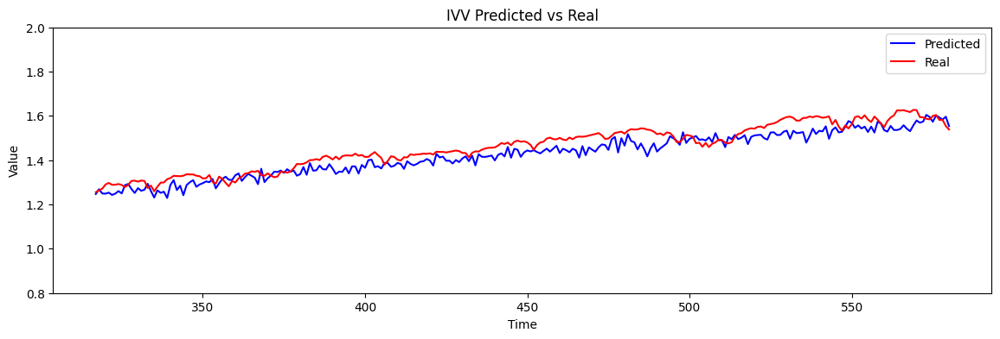

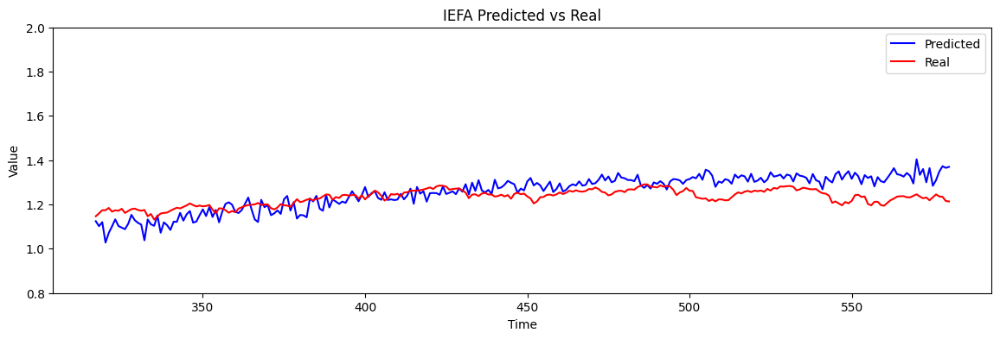

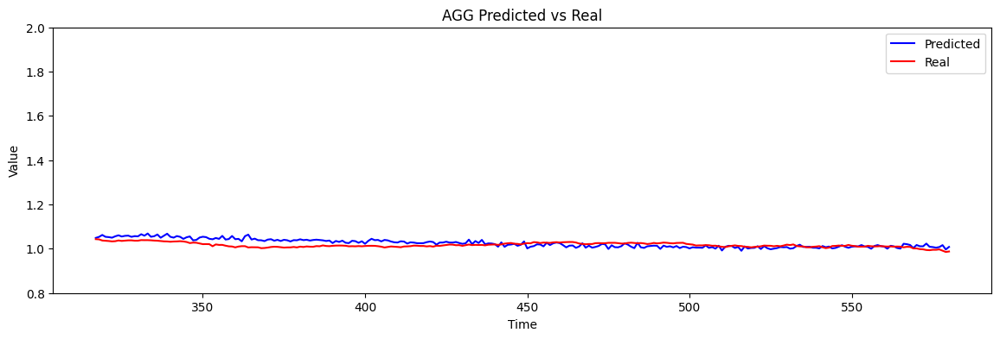

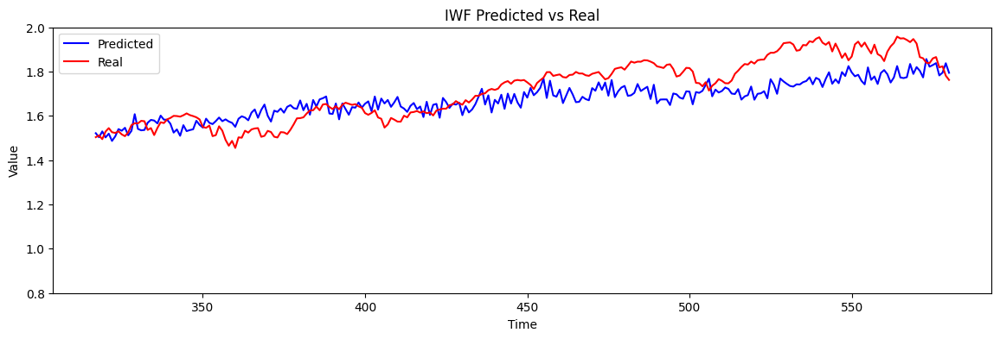

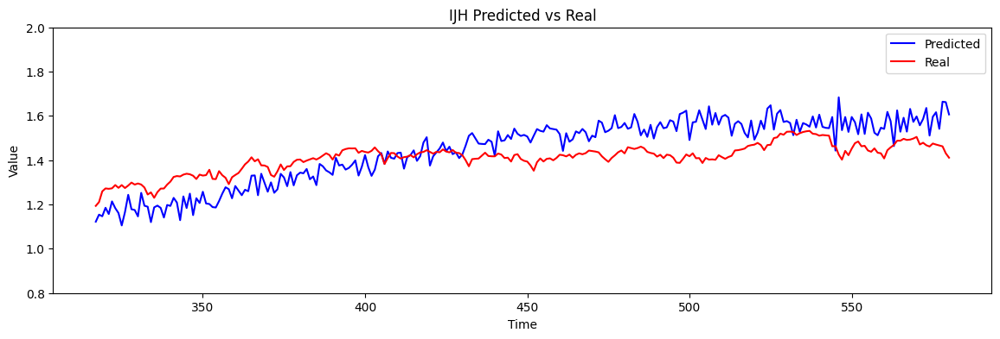

...

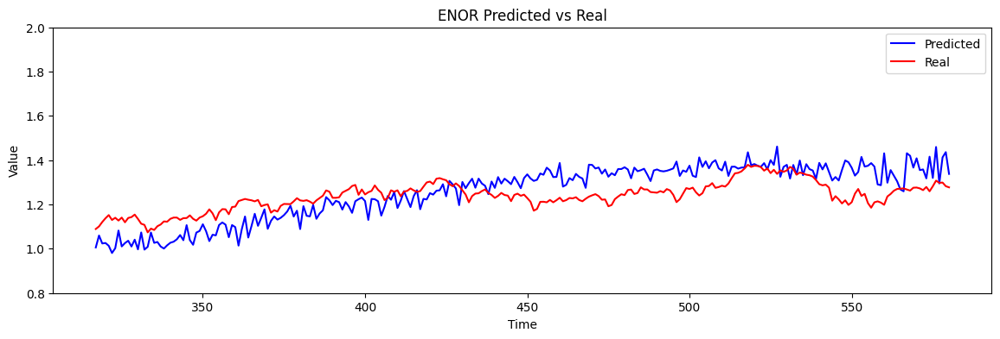

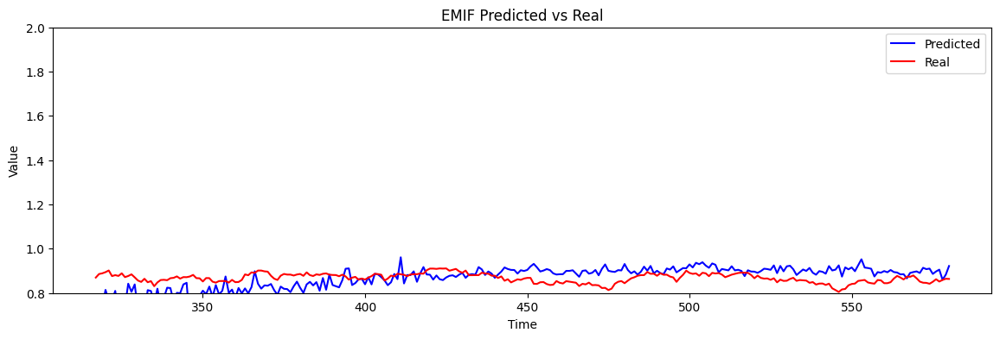

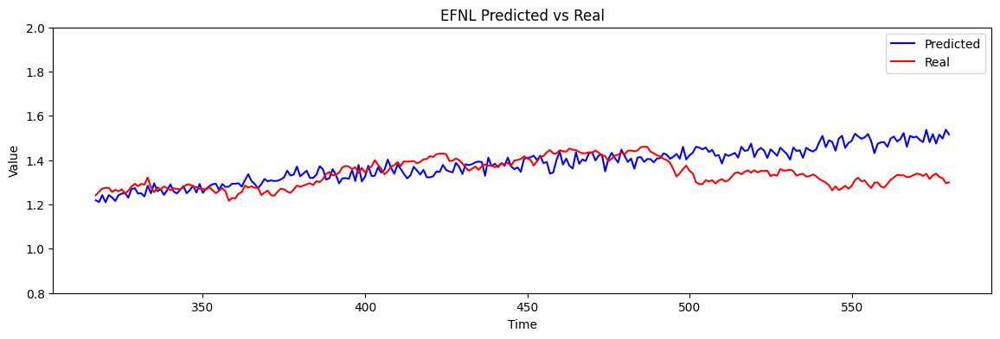

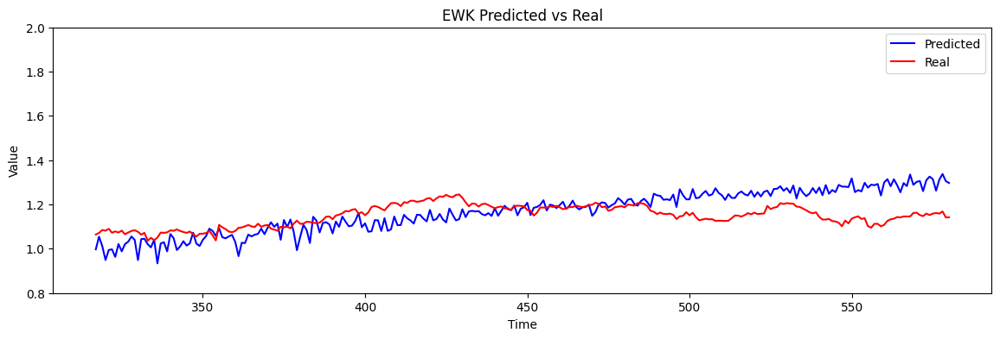

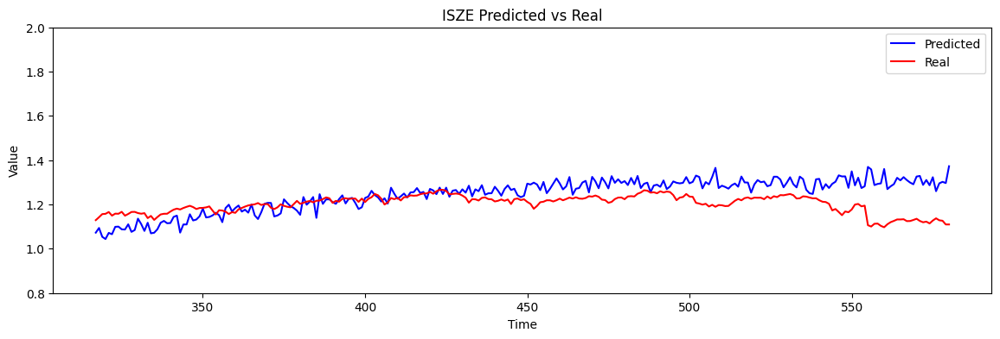

In [22]:
for ticker in tickers: 
    start_date = '2019-10-01'
    end_date = '2021-01-01'
    print(ticker)
    RES = pd.DataFrame()   
    for i in range(11):    
        # history : 2019-10-01 ~ 2022-01-01 的数据
        history = pd.read_csv(f'data/total/{ticker}.csv')
        history['date'] = pd.to_datetime(history['date'])

        # data : Warming Up 期间的数据
        data = history[(history['date'] >= start_date) 
                    & (history['date'] <= end_date)]
        df = data[["Return"]]
        #df.plot(figsize=(15,5), title="Closing Price of Asset")
        df = df.reset_index(drop=True)
        #df.plot(figsize=(15,5), title = 'Daily percentage change (Daily Return)')
        df_norm = df.to_numpy()
        num_epoch = 200
        config = dict(
            batch_size= 64,
            kernel_size= 21,
            learning_rate= 0.0001,
            seq_len= 96,
            pred_len= 24,
        )
        device = 'cuda' if torch.cuda.is_available() else 'cpu'

        data_set = Dataset_Custom(
                df=df_norm,
                seq_len=config['seq_len'],
                pred_len=config['pred_len']
                )

        data_loader = DataLoader(
                data_set,
                batch_size=config['batch_size'],
                shuffle=True,
                drop_last=False)

        model = DLinear(seq_len=config['seq_len'],
                        pred_len=config['pred_len'],
                        kernel_size=config['kernel_size']
                        ).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr=config['learning_rate'])
        criterion = nn.L1Loss().to(device)

        train_loss_ep = []
        for epoch in tqdm(range(num_epoch)):
            train_loss = []

            model.train()
            for i, (batch_x, batch_y) in enumerate(data_loader):
                
                batch_x = batch_x.float().to(device)
                batch_y = batch_y.float().to(device)

                outputs = model(batch_x)


                loss = criterion(outputs, batch_y)
                loss.backward()
                optimizer.step()
                optimizer.zero_grad()

                #log
                train_loss.append(loss.item())

            train_loss_ep.append(np.average(train_loss))

            #print(f"Epoch: {epoch+1}/{num_epoch}, Training Loss: {np.average(train_loss)}")
        #pd.DataFrame(train_loss_ep).plot()
        r = df_norm[-config['seq_len']:,:]
        x = torch.tensor(r[-config['seq_len']:,:]).unsqueeze(0)
        model.eval()
        with torch.no_grad():
            output = model(x.float().to(device))
        r = np.append(r, output.squeeze(0).to("cpu").detach().numpy(), axis=0)
        res_df = pd.DataFrame(r[-24:])
        res_df.columns = ["ret_pred"]
        #res_df.plot(figsize=(15,5))
        if RES.empty:
            RES = res_df
        else :
            RES = pd.concat([RES,res_df],axis = 0, ignore_index = True)
        start_date = shift_date_24(start_date, 24)
        end_date = shift_date_24(end_date, 24)
        reset_weights(model)
    
    
    REAL = history[(history['date'] >= '2021-01-04') 
                & (history['date'] <= '2022-01-19')]
    print(f'{ticker}:{REAL.head()}')
    REAL['pred'] = RES.values

    # 假设 pred 和 real 是你的两个时间序列数据

    # 创建一个新的图形
    plt.figure(figsize=(14, 4))

    # 绘制 pred 数据
    plt.plot(REAL['pred'], label='Predicted', color='blue')

    # 绘制 real 数据
    plt.plot(REAL['Return'], label='Real', color='red')

    # 添加标题和标签
    plt.title(f'{ticker} Predicted vs Real')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.ylim(0.8, 2.0)
    # 添加图例
    plt.legend()

    # 显示图形
    plt.savefig(f'image/total/{rdseed}_{ticker}png', dpi=300)

    REAL.to_csv(f'res/total/{rdseed}_{ticker}pred.csv', index =False)